In [1]:
!pip install missingno
!pip install ycimpute

In [2]:
import pandas as pd
import numpy as np
import plotly.graph_objs as go
import plotly.tools as tls
import plotly.offline as py
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.neighbors import LocalOutlierFactor
import missingno as msno
import plotly.figure_factory as ff
import hvplot
from matplotlib.ticker import FormatStrFormatter
import hvplot.pandas
from sklearn.model_selection import RandomizedSearchCV
import plotly.express as px
from ycimpute.imputer import knnimput
from catboost import CatBoostClassifier
from ycimpute.imputer import iterforest
from ycimpute.imputer import EM
import xgboost as xgb
from sklearn.model_selection import train_test_split
from sklearn import preprocessing
import pylab
import matplotlib as mpl
import plotly.graph_objects as go
from scipy.stats import shapiro
import scipy.stats as stats
import statsmodels.api as sm
import statsmodels.formula.api as smf
from sklearn.linear_model import LinearRegression
import xgboost as xgb
from sklearn.datasets import make_moons
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report
from sklearn.metrics import mean_squared_error , r2_score
from matplotlib.ticker import FormatStrFormatter
from sklearn.model_selection import train_test_split, GridSearchCV,cross_val_score
from sklearn.metrics import confusion_matrix, accuracy_score, f1_score, precision_score, recall_score,classification_report, roc_auc_score
from sklearn.preprocessing import scale 
from sklearn import model_selection
from sklearn.tree import DecisionTreeRegressor, DecisionTreeClassifier
from xgboost import XGBRegressor
from sklearn.neighbors import KNeighborsRegressor
from sklearn.ensemble import BaggingRegressor
from sklearn.model_selection import GridSearchCV
from sklearn.ensemble import RandomForestRegressor
from sklearn.preprocessing import StandardScaler
from sklearn.neural_network import MLPRegressor
import collections
from sklearn import tree
from sklearn.tree import DecisionTreeRegressor, DecisionTreeClassifier
import graphviz
from sklearn.linear_model import LogisticRegression
from sklearn import metrics
pd.set_option('display.max_rows', None)
pd.set_option("display.max_columns",None)
import scipy
from scipy.stats import chi2_contingency 
from plotly.subplots import make_subplots
from plotly.offline import init_notebook_mode
from statistics import stdev
from pprint import pprint
from tqdm import tqdm
from sklearn.preprocessing import RobustScaler, StandardScaler
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import accuracy_score, roc_auc_score
init_notebook_mode(connected=True)
sns.set_context("notebook")

import warnings
warnings.filterwarnings("ignore")

In [3]:
data= pd.read_excel("WA_Fn-UseC_-HR-Employee-Attrition01 (1).xlsx")

In [4]:
df= data.copy()

In [5]:
df.head()

,Age,Attrition,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EmployeeCount,EmployeeNumber,EnvironmentSatisfaction,Gender,HourlyRate,JobInvolvement,JobLevel,JobRole,JobSatisfaction,MaritalStatus,MonthlyIncome,MonthlyRate,NumCompaniesWorked,Over18,OverTime,PercentSalaryHike,PerformanceRating,RelationshipSatisfaction,StandardHours,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager,Country
0,41,Yes,Travel_Rarely,1102,Sales,1,2,Life Sciences,1,1,2,Female,94,3,2,Sales Executive,4,Single,5993,19479,8,Y,Yes,11,3,1,80,0,8,0,1,6,4,0,5,Russia
1,49,No,Travel_Frequently,279,Research & Development,8,1,Life Sciences,1,2,3,Male,61,2,2,Research Scientist,2,Married,5130,24907,1,Y,No,23,4,4,80,1,10,3,3,10,7,1,7,Germany
2,37,Yes,Travel_Rarely,1373,Research & Development,2,2,Other,1,4,4,Male,92,2,1,Laboratory Technician,3,Single,2090,2396,6,Y,Yes,15,3,2,80,0,7,3,3,0,0,0,0,United Kingdom
3,33,No,Travel_Frequently,1392,Research & Development,3,4,Life Sciences,1,5,4,Female,56,3,1,Research Scientist,3,Married,2909,23159,1,Y,Yes,11,3,3,80,0,8,3,3,8,7,3,0,France
4,27,No,Travel_Rarely,591,Research & Development,2,1,Medical,1,7,1,Male,40,3,1,Laboratory Technician,2,Married,3468,16632,9,Y,No,12,3,4,80,1,6,3,3,2,2,2,2,Italy


In [6]:
df.drop(["Country"], axis = 1, inplace = True)

In [7]:
df.shape

(1470, 35)

In [8]:
df.dtypes

Age                          int64
Attrition                   object
BusinessTravel              object
DailyRate                    int64
Department                  object
DistanceFromHome             int64
Education                    int64
EducationField              object
EmployeeCount                int64
EmployeeNumber               int64
EnvironmentSatisfaction      int64
Gender                      object
HourlyRate                   int64
JobInvolvement               int64
JobLevel                     int64
JobRole                     object
JobSatisfaction              int64
MaritalStatus               object
MonthlyIncome                int64
MonthlyRate                  int64
NumCompaniesWorked           int64
Over18                      object
OverTime                    object
PercentSalaryHike            int64
PerformanceRating            int64
RelationshipSatisfaction     int64
StandardHours                int64
StockOptionLevel             int64
TotalWorkingYears   

In [9]:
def check_df(dataframe, satir_sayisi):
    print("##################### Shape #####################")
    print(dataframe.shape)
    print("##################### Types #####################")
    print(dataframe.dtypes)
    print("##################### Head #####################")
    print(dataframe.head(satir_sayisi))
    print("##################### Tail #####################")
    print(dataframe.tail(satir_sayisi))
    print("##################### NA #####################")
    print(dataframe.isnull().sum())
    print("##################### Quantiles #####################")
    print(dataframe.describe([0, 0.05, 0.50, 0.95, 0.99, 1]).T)

In [10]:
check_df(df,10)

##################### Shape #####################
(1470, 35)
##################### Types #####################
Age                          int64
Attrition                   object
BusinessTravel              object
DailyRate                    int64
Department                  object
DistanceFromHome             int64
Education                    int64
EducationField              object
EmployeeCount                int64
EmployeeNumber               int64
EnvironmentSatisfaction      int64
Gender                      object
HourlyRate                   int64
JobInvolvement               int64
JobLevel                     int64
JobRole                     object
JobSatisfaction              int64
MaritalStatus               object
MonthlyIncome                int64
MonthlyRate                  int64
NumCompaniesWorked           int64
Over18                      object
OverTime                    object
PercentSalaryHike            int64
PerformanceRating            int64
RelationshipSa

In [11]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
Age,1470.0,36.923810,9.135373,18.0,30.00,36.0,43.00,60.0
DailyRate,1470.0,802.485714,403.509100,102.0,465.00,802.0,1157.00,1499.0
DistanceFromHome,1470.0,9.192517,8.106864,1.0,2.00,7.0,14.00,29.0
Education,1470.0,2.912925,1.024165,1.0,2.00,3.0,4.00,5.0
EmployeeCount,1470.0,1.000000,0.000000,1.0,1.00,1.0,1.00,1.0
EmployeeNumber,1470.0,1024.865306,602.024335,1.0,491.25,1020.5,1555.75,2068.0
EnvironmentSatisfaction,1470.0,2.721769,1.093082,1.0,2.00,3.0,4.00,4.0
HourlyRate,1470.0,65.891156,20.329428,30.0,48.00,66.0,83.75,100.0
JobInvolvement,1470.0,2.729932,0.711561,1.0,2.00,3.0,3.00,4.0
JobLevel,1470.0,2.063946,1.106940,1.0,1.00,2.0,3.00,5.0


In [12]:
for column in df.columns:
    print(f"{column}: Eşsiz değer sayısı: {df[column].nunique()}")
    print("==========================================================")

Age: Eşsiz değer sayısı: 43
Attrition: Eşsiz değer sayısı: 2
BusinessTravel: Eşsiz değer sayısı: 3
DailyRate: Eşsiz değer sayısı: 886
Department: Eşsiz değer sayısı: 3
DistanceFromHome: Eşsiz değer sayısı: 29
Education: Eşsiz değer sayısı: 5
EducationField: Eşsiz değer sayısı: 6
EmployeeCount: Eşsiz değer sayısı: 1
EmployeeNumber: Eşsiz değer sayısı: 1470
EnvironmentSatisfaction: Eşsiz değer sayısı: 4
Gender: Eşsiz değer sayısı: 2
HourlyRate: Eşsiz değer sayısı: 71
JobInvolvement: Eşsiz değer sayısı: 4
JobLevel: Eşsiz değer sayısı: 5
JobRole: Eşsiz değer sayısı: 9
JobSatisfaction: Eşsiz değer sayısı: 4
MaritalStatus: Eşsiz değer sayısı: 3
MonthlyIncome: Eşsiz değer sayısı: 1349
MonthlyRate: Eşsiz değer sayısı: 1427
NumCompaniesWorked: Eşsiz değer sayısı: 10
Over18: Eşsiz değer sayısı: 1
OverTime: Eşsiz değer sayısı: 2
PercentSalaryHike: Eşsiz değer sayısı: 15
PerformanceRating: Eşsiz değer sayısı: 2
RelationshipSatisfaction: Eşsiz değer sayısı: 4
StandardHours: Eşsiz değer sayısı: 1
St

In [13]:
print("Missing Values by Column")
print("-"*30)
print(df.isnull().sum())
print("-"*30)
print("TOTAL MISSING VALUES:",df.isna().sum().sum())

Missing Values by Column
------------------------------
Age                         0
Attrition                   0
BusinessTravel              0
DailyRate                   0
Department                  0
DistanceFromHome            0
Education                   0
EducationField              0
EmployeeCount               0
EmployeeNumber              0
EnvironmentSatisfaction     0
Gender                      0
HourlyRate                  0
JobInvolvement              0
JobLevel                    0
JobRole                     0
JobSatisfaction             0
MaritalStatus               0
MonthlyIncome               0
MonthlyRate                 0
NumCompaniesWorked          0
Over18                      0
OverTime                    0
PercentSalaryHike           0
PerformanceRating           0
RelationshipSatisfaction    0
StandardHours               0
StockOptionLevel            0
TotalWorkingYears           0
TrainingTimesLastYear       0
WorkLifeBalance             0
YearsAtCompany

In [14]:
temp=[]
for col in df.columns:
    if len(df[col].unique())==1:
        temp.append(col)
        df.drop(col,inplace= True, axis=1)
temp

['EmployeeCount', 'Over18', 'StandardHours']

In [15]:
df.drop(["EmployeeNumber"], axis = 1, inplace = True)

In [16]:
df.head()

,Age,Attrition,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EnvironmentSatisfaction,Gender,HourlyRate,JobInvolvement,JobLevel,JobRole,JobSatisfaction,MaritalStatus,MonthlyIncome,MonthlyRate,NumCompaniesWorked,OverTime,PercentSalaryHike,PerformanceRating,RelationshipSatisfaction,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
0,41,Yes,Travel_Rarely,1102,Sales,1,2,Life Sciences,2,Female,94,3,2,Sales Executive,4,Single,5993,19479,8,Yes,11,3,1,0,8,0,1,6,4,0,5
1,49,No,Travel_Frequently,279,Research & Development,8,1,Life Sciences,3,Male,61,2,2,Research Scientist,2,Married,5130,24907,1,No,23,4,4,1,10,3,3,10,7,1,7
2,37,Yes,Travel_Rarely,1373,Research & Development,2,2,Other,4,Male,92,2,1,Laboratory Technician,3,Single,2090,2396,6,Yes,15,3,2,0,7,3,3,0,0,0,0
3,33,No,Travel_Frequently,1392,Research & Development,3,4,Life Sciences,4,Female,56,3,1,Research Scientist,3,Married,2909,23159,1,Yes,11,3,3,0,8,3,3,8,7,3,0
4,27,No,Travel_Rarely,591,Research & Development,2,1,Medical,1,Male,40,3,1,Laboratory Technician,2,Married,3468,16632,9,No,12,3,4,1,6,3,3,2,2,2,2


In [17]:
df["Attrition_num"]=df.apply(lambda x: 1 if (x["Attrition"] == "Yes")else 0, axis=1)

In [18]:
cat_cols = [col for col in df.columns if df[col].dtypes == "O"]

In [19]:
num_cols = [col for col in df.columns if df[col].dtypes != "O"]

     Attrition      Ratio
No        1233  83.877551
Yes        237  16.122449


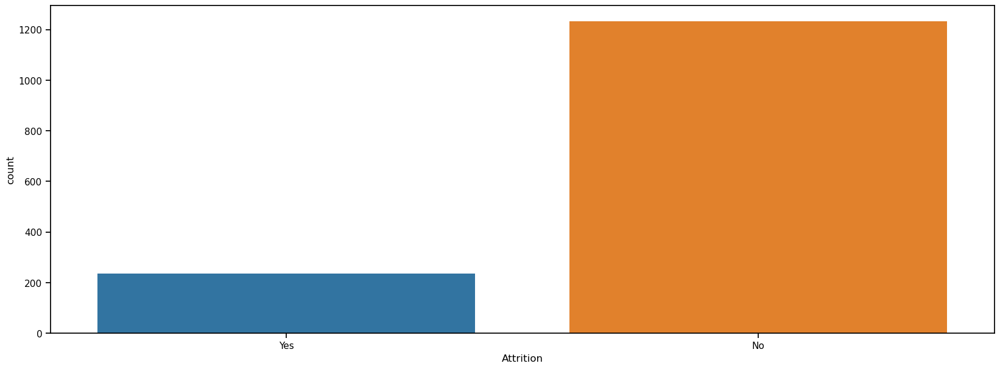

                   BusinessTravel      Ratio
Travel_Rarely                1043  70.952381
Travel_Frequently             277  18.843537
Non-Travel                    150  10.204082


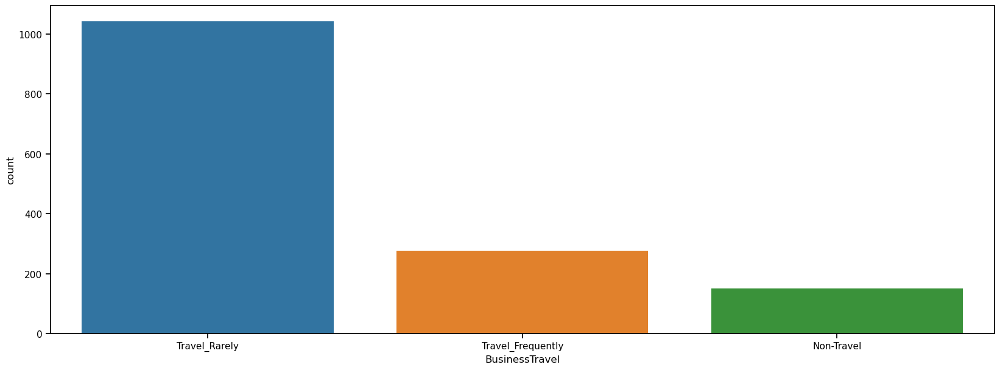

                        Department      Ratio
Research & Development         961  65.374150
Sales                          446  30.340136
Human Resources                 63   4.285714


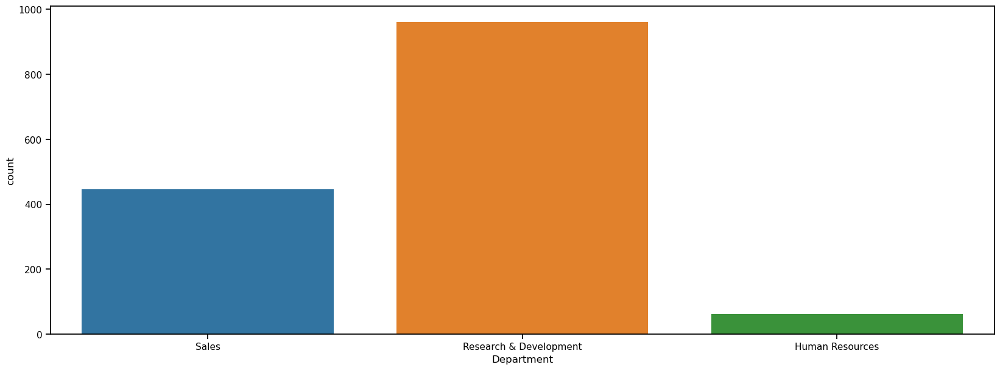

                  EducationField      Ratio
Life Sciences                606  41.224490
Medical                      464  31.564626
Marketing                    159  10.816327
Technical Degree             132   8.979592
Other                         82   5.578231
Human Resources               27   1.836735


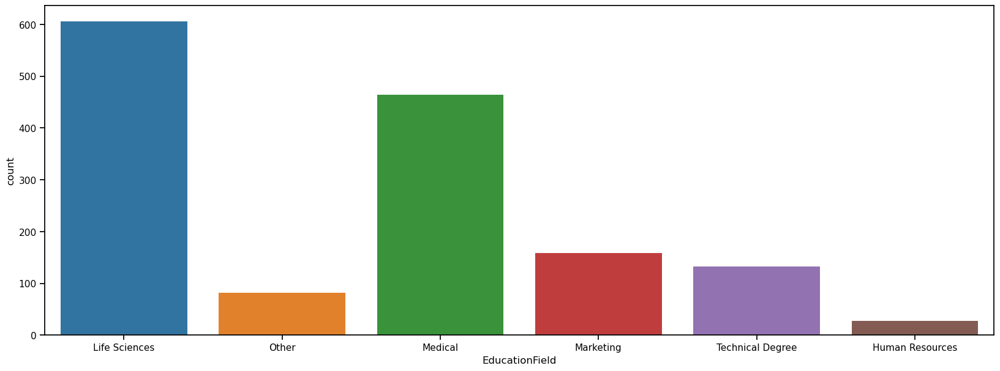

        Gender  Ratio
Male       882   60.0
Female     588   40.0


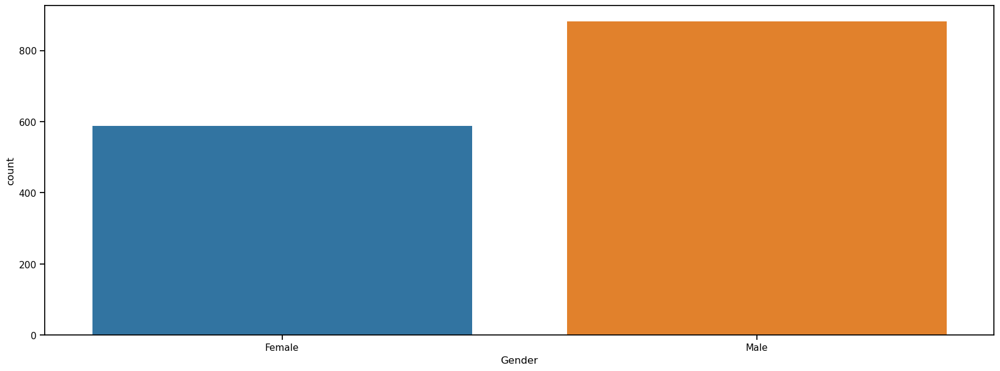

                           JobRole      Ratio
Sales Executive                326  22.176871
Research Scientist             292  19.863946
Laboratory Technician          259  17.619048
Manufacturing Director         145   9.863946
Healthcare Representative      131   8.911565
Manager                        102   6.938776
Sales Representative            83   5.646259
Research Director               80   5.442177
Human Resources                 52   3.537415


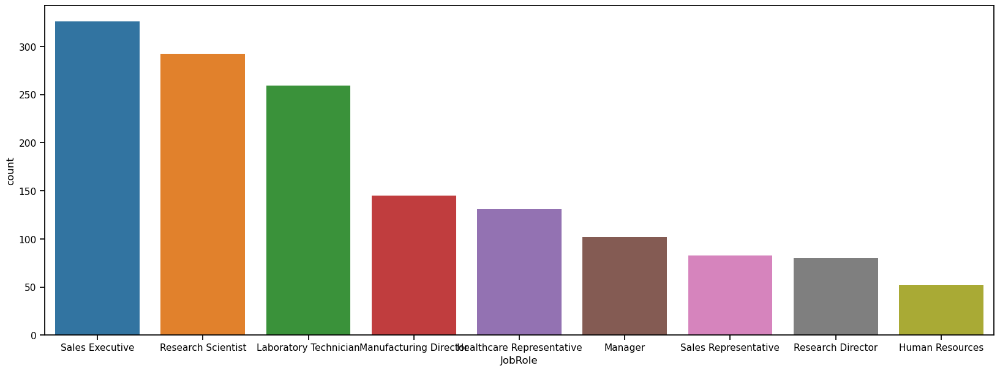

          MaritalStatus      Ratio
Married             673  45.782313
Single              470  31.972789
Divorced            327  22.244898


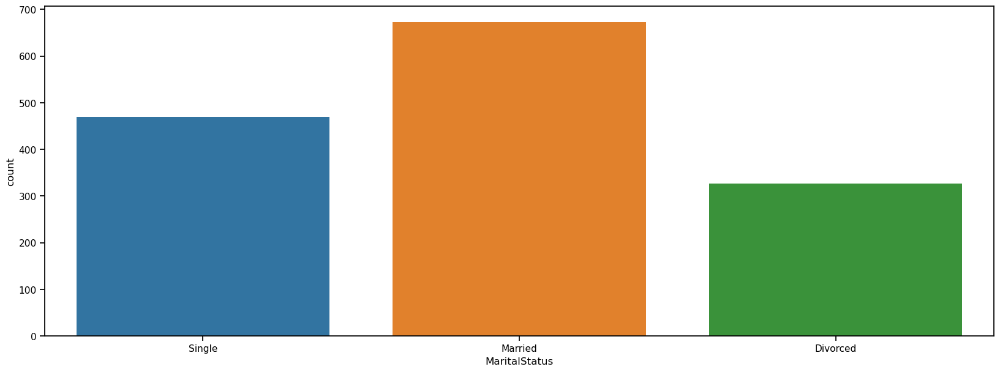

     OverTime     Ratio
No       1054  71.70068
Yes       416  28.29932


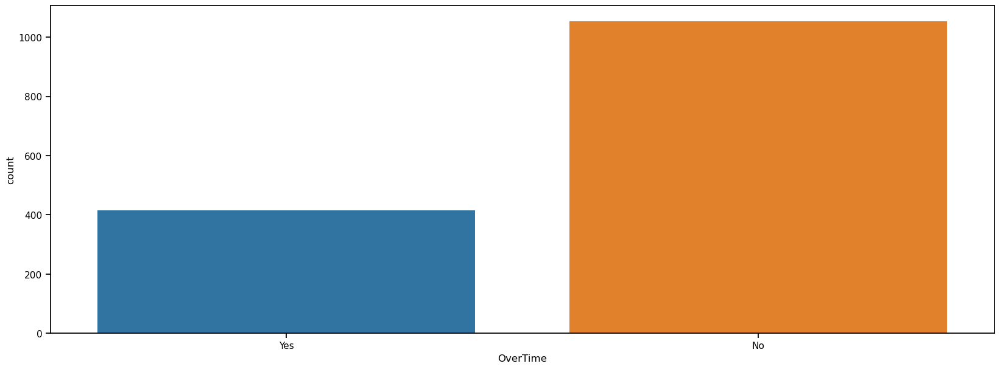

In [20]:
for col in cat_cols:
        print(pd.DataFrame({col: df[col].value_counts(),
                        "Ratio": 100 * df[col].value_counts() / len(df)}))
        plt.figure(figsize=(20,7))
        sns.countplot(x=df[col], data=df)
        plt.show()

count    1470.000000
mean       36.923810
std         9.135373
min        18.000000
1%         19.000000
5%         24.000000
25%        30.000000
50%        36.000000
75%        43.000000
95%        54.000000
99%        58.310000
max        60.000000
Name: Age, dtype: float64


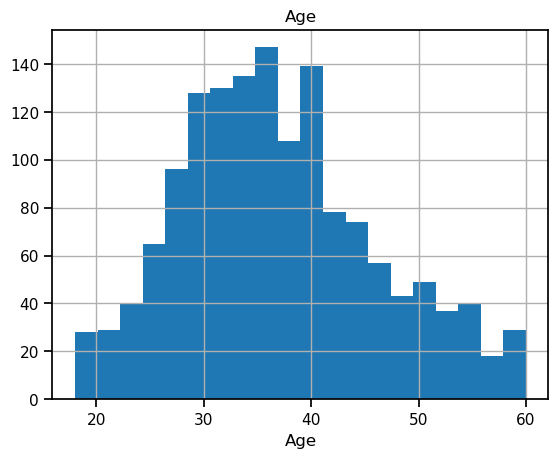

count    1470.000000
mean      802.485714
std       403.509100
min       102.000000
1%        117.000000
5%        165.350000
25%       465.000000
50%       802.000000
75%      1157.000000
95%      1424.100000
99%      1485.000000
max      1499.000000
Name: DailyRate, dtype: float64


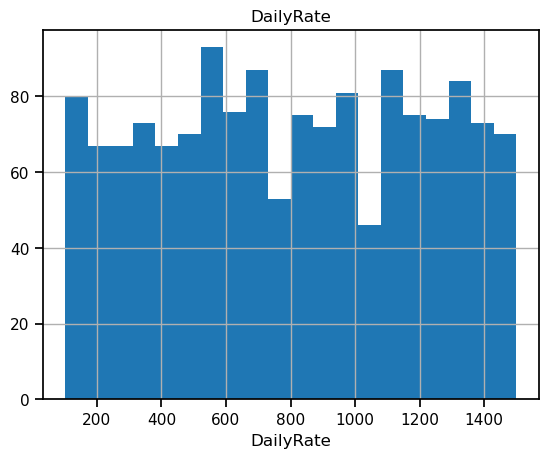

count    1470.000000
mean        9.192517
std         8.106864
min         1.000000
1%          1.000000
5%          1.000000
25%         2.000000
50%         7.000000
75%        14.000000
95%        26.000000
99%        29.000000
max        29.000000
Name: DistanceFromHome, dtype: float64


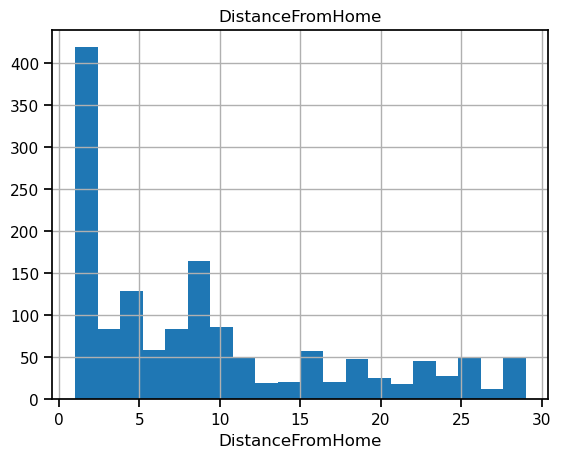

count    1470.000000
mean        2.912925
std         1.024165
min         1.000000
1%          1.000000
5%          1.000000
25%         2.000000
50%         3.000000
75%         4.000000
95%         4.000000
99%         5.000000
max         5.000000
Name: Education, dtype: float64


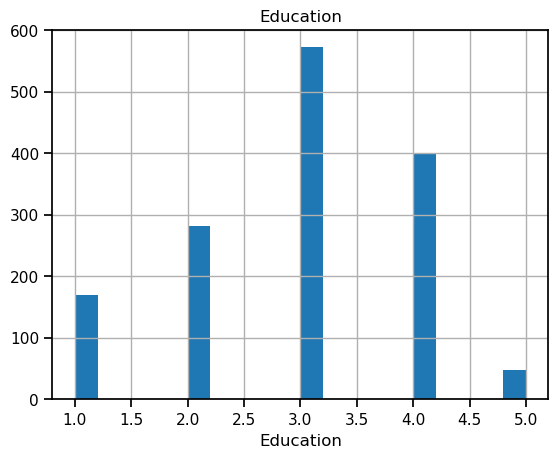

count    1470.000000
mean        2.721769
std         1.093082
min         1.000000
1%          1.000000
5%          1.000000
25%         2.000000
50%         3.000000
75%         4.000000
95%         4.000000
99%         4.000000
max         4.000000
Name: EnvironmentSatisfaction, dtype: float64


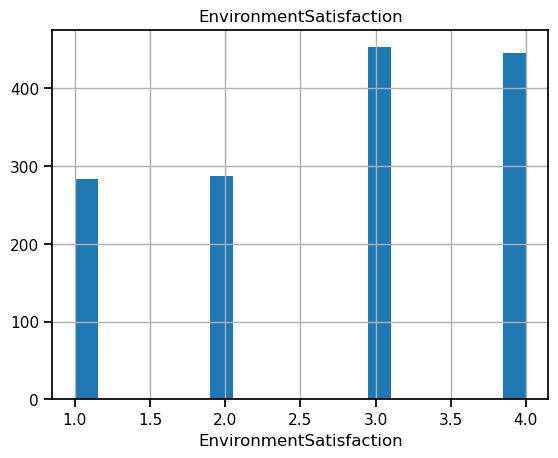

count    1470.000000
mean       65.891156
std        20.329428
min        30.000000
1%         30.000000
5%         33.000000
25%        48.000000
50%        66.000000
75%        83.750000
95%        97.000000
99%       100.000000
max       100.000000
Name: HourlyRate, dtype: float64


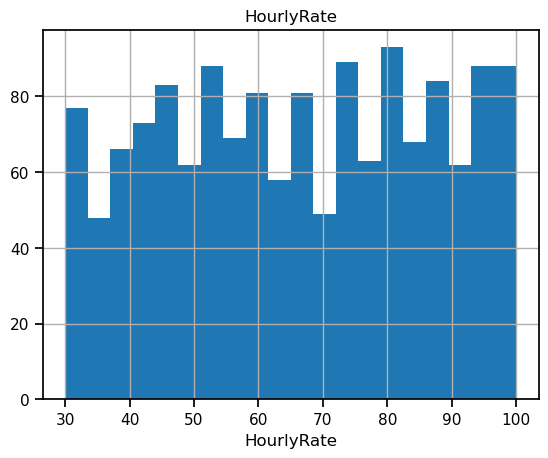

count    1470.000000
mean        2.729932
std         0.711561
min         1.000000
1%          1.000000
5%          1.000000
25%         2.000000
50%         3.000000
75%         3.000000
95%         4.000000
99%         4.000000
max         4.000000
Name: JobInvolvement, dtype: float64


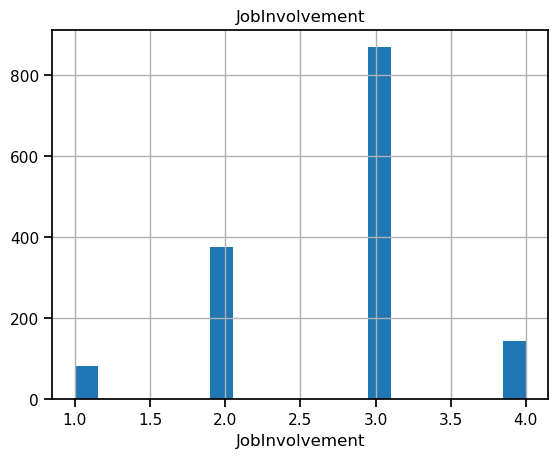

count    1470.000000
mean        2.063946
std         1.106940
min         1.000000
1%          1.000000
5%          1.000000
25%         1.000000
50%         2.000000
75%         3.000000
95%         4.000000
99%         5.000000
max         5.000000
Name: JobLevel, dtype: float64


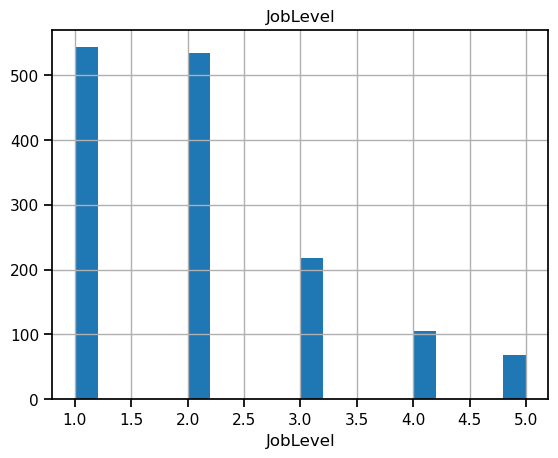

count    1470.000000
mean        2.728571
std         1.102846
min         1.000000
1%          1.000000
5%          1.000000
25%         2.000000
50%         3.000000
75%         4.000000
95%         4.000000
99%         4.000000
max         4.000000
Name: JobSatisfaction, dtype: float64


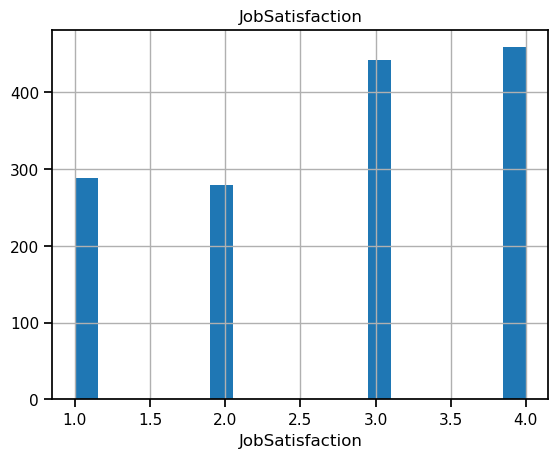

count     1470.000000
mean      6502.931293
std       4707.956783
min       1009.000000
1%        1382.460000
5%        2097.900000
25%       2911.000000
50%       4919.000000
75%       8379.000000
95%      17821.350000
99%      19626.310000
max      19999.000000
Name: MonthlyIncome, dtype: float64


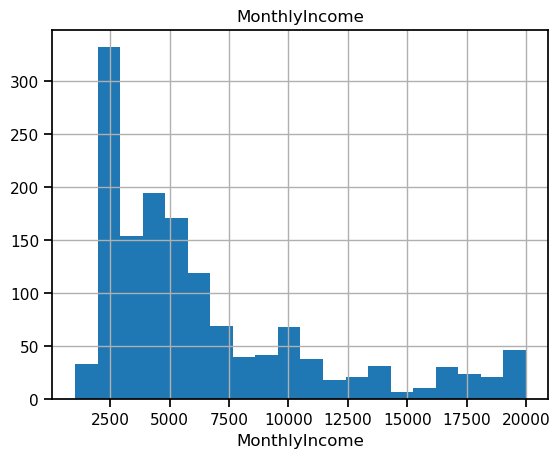

count     1470.000000
mean     14313.103401
std       7117.786044
min       2094.000000
1%        2325.070000
5%        3384.550000
25%       8047.000000
50%      14235.500000
75%      20461.500000
95%      25431.900000
99%      26704.240000
max      26999.000000
Name: MonthlyRate, dtype: float64


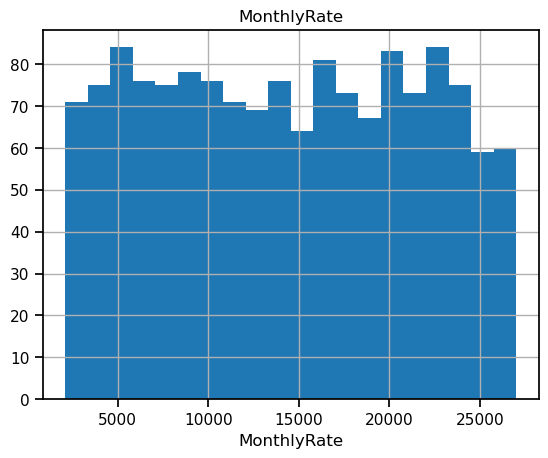

count    1470.000000
mean        2.693197
std         2.498009
min         0.000000
1%          0.000000
5%          0.000000
25%         1.000000
50%         2.000000
75%         4.000000
95%         8.000000
99%         9.000000
max         9.000000
Name: NumCompaniesWorked, dtype: float64


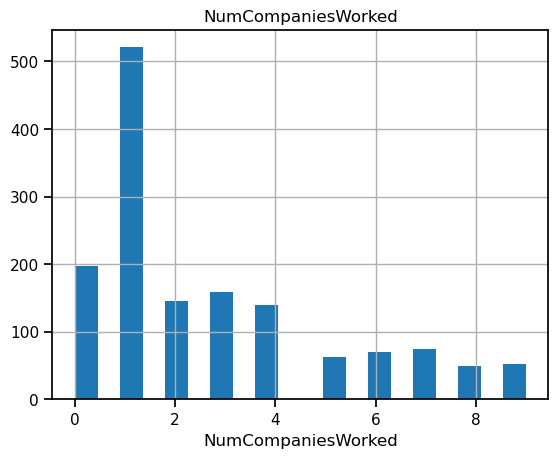

count    1470.000000
mean       15.209524
std         3.659938
min        11.000000
1%         11.000000
5%         11.000000
25%        12.000000
50%        14.000000
75%        18.000000
95%        22.000000
99%        25.000000
max        25.000000
Name: PercentSalaryHike, dtype: float64


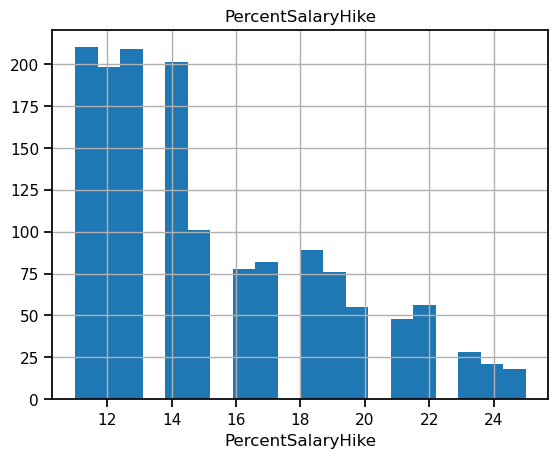

count    1470.000000
mean        3.153741
std         0.360824
min         3.000000
1%          3.000000
5%          3.000000
25%         3.000000
50%         3.000000
75%         3.000000
95%         4.000000
99%         4.000000
max         4.000000
Name: PerformanceRating, dtype: float64


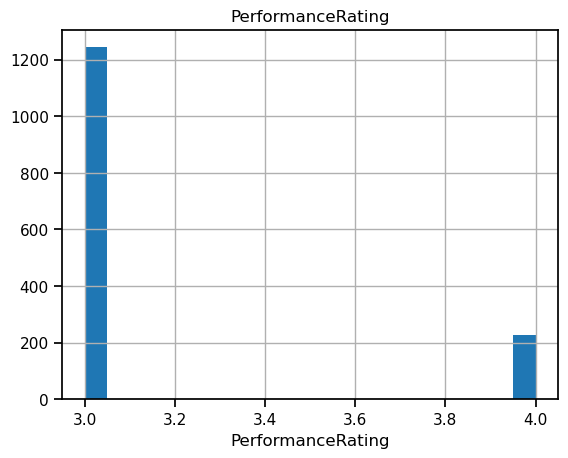

count    1470.000000
mean        2.712245
std         1.081209
min         1.000000
1%          1.000000
5%          1.000000
25%         2.000000
50%         3.000000
75%         4.000000
95%         4.000000
99%         4.000000
max         4.000000
Name: RelationshipSatisfaction, dtype: float64


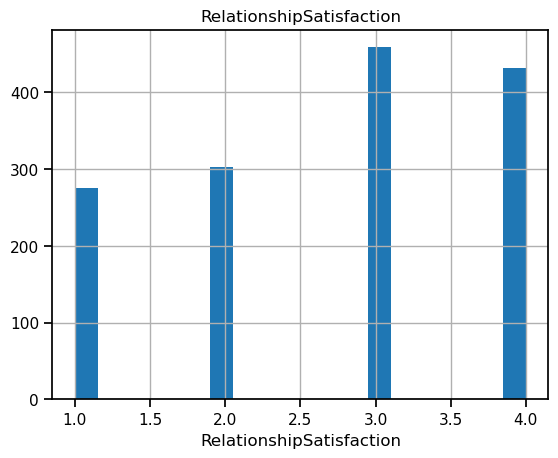

count    1470.000000
mean        0.793878
std         0.852077
min         0.000000
1%          0.000000
5%          0.000000
25%         0.000000
50%         1.000000
75%         1.000000
95%         3.000000
99%         3.000000
max         3.000000
Name: StockOptionLevel, dtype: float64


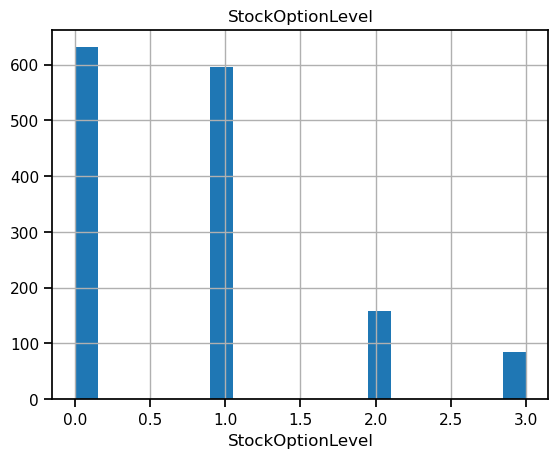

count    1470.000000
mean       11.279592
std         7.780782
min         0.000000
1%          1.000000
5%          1.000000
25%         6.000000
50%        10.000000
75%        15.000000
95%        28.000000
99%        35.000000
max        40.000000
Name: TotalWorkingYears, dtype: float64


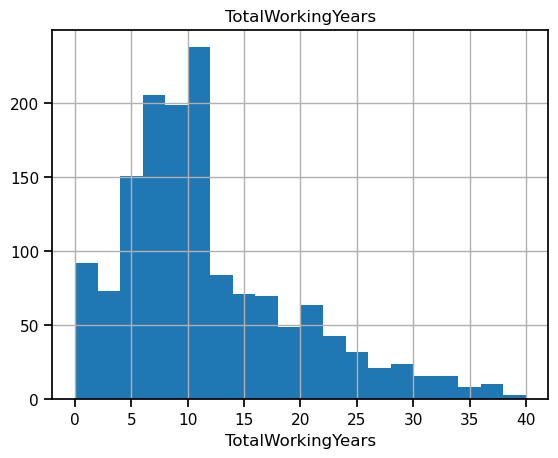

count    1470.000000
mean        2.799320
std         1.289271
min         0.000000
1%          0.000000
5%          1.000000
25%         2.000000
50%         3.000000
75%         3.000000
95%         5.000000
99%         6.000000
max         6.000000
Name: TrainingTimesLastYear, dtype: float64


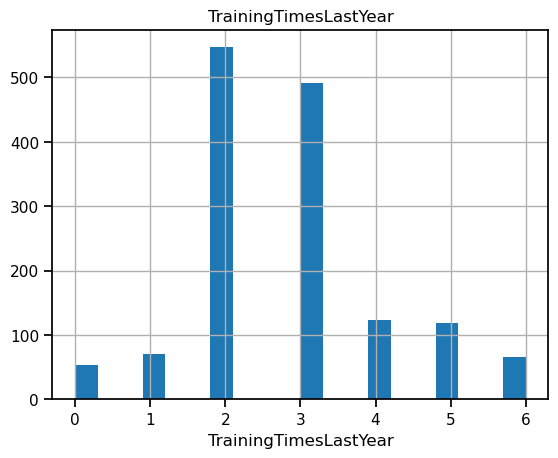

count    1470.000000
mean        2.761224
std         0.706476
min         1.000000
1%          1.000000
5%          1.000000
25%         2.000000
50%         3.000000
75%         3.000000
95%         4.000000
99%         4.000000
max         4.000000
Name: WorkLifeBalance, dtype: float64


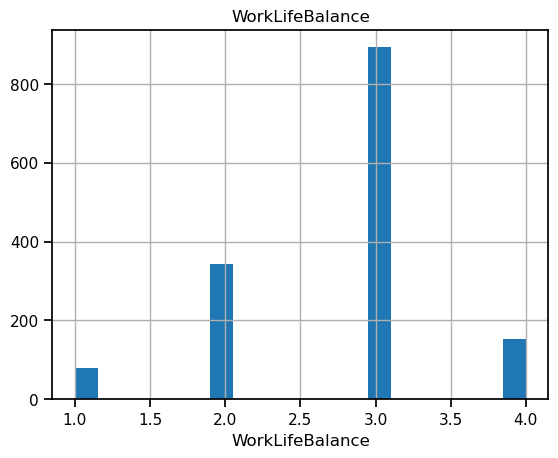

count    1470.000000
mean        7.008163
std         6.126525
min         0.000000
1%          0.000000
5%          1.000000
25%         3.000000
50%         5.000000
75%         9.000000
95%        20.000000
99%        31.000000
max        40.000000
Name: YearsAtCompany, dtype: float64


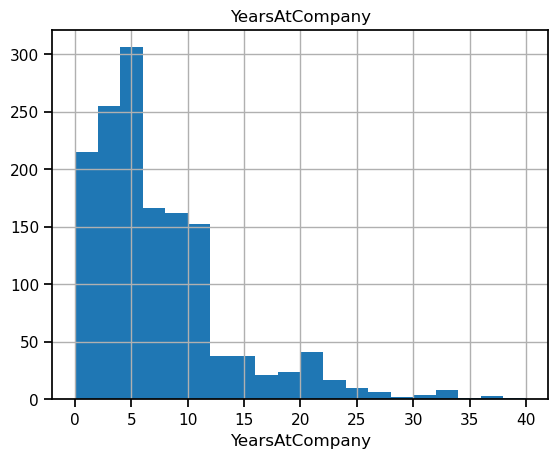

count    1470.000000
mean        4.229252
std         3.623137
min         0.000000
1%          0.000000
5%          0.000000
25%         2.000000
50%         3.000000
75%         7.000000
95%        11.000000
99%        15.000000
max        18.000000
Name: YearsInCurrentRole, dtype: float64


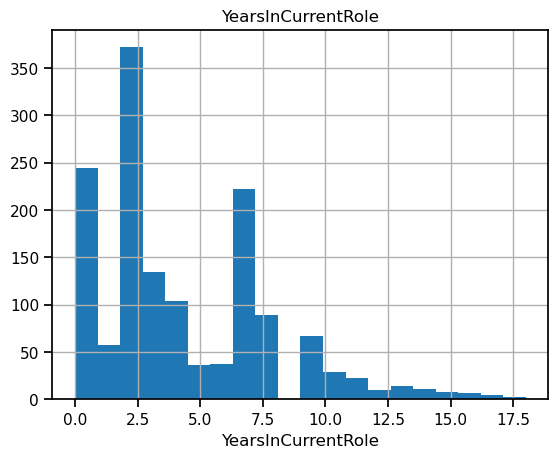

count    1470.000000
mean        2.187755
std         3.222430
min         0.000000
1%          0.000000
5%          0.000000
25%         0.000000
50%         1.000000
75%         3.000000
95%         9.000000
99%        14.000000
max        15.000000
Name: YearsSinceLastPromotion, dtype: float64


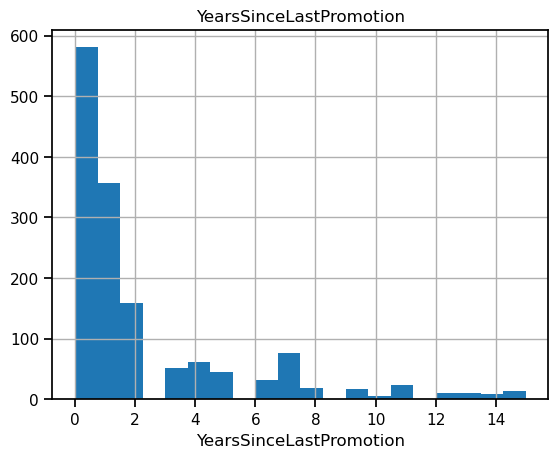

count    1470.000000
mean        4.123129
std         3.568136
min         0.000000
1%          0.000000
5%          0.000000
25%         2.000000
50%         3.000000
75%         7.000000
95%        10.000000
99%        14.000000
max        17.000000
Name: YearsWithCurrManager, dtype: float64


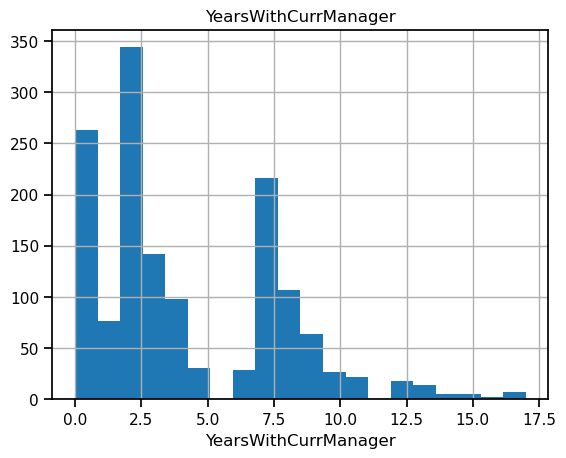

count    1470.000000
mean        0.161224
std         0.367863
min         0.000000
1%          0.000000
5%          0.000000
25%         0.000000
50%         0.000000
75%         0.000000
95%         1.000000
99%         1.000000
max         1.000000
Name: Attrition_num, dtype: float64


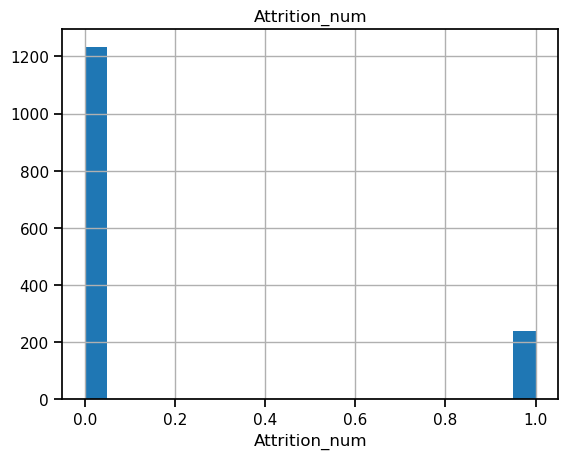

In [21]:
quantiles = [0.01, 0.05, 0.25, 0.50, 0.75, 0.95, 0.99]
for col in num_cols:
    print(df[col].describe(quantiles).T)
    
    df[col].hist(bins=20)
    plt.xlabel(col)
    plt.title(col)
    plt.show()

In [22]:
for col in num_cols:
    print(df.groupby("Attrition").agg({col: "mean"}), end="\n\n\n")

                 Age
Attrition           
No         37.561233
Yes        33.607595


            DailyRate
Attrition            
No         812.504461
Yes        750.362869


           DistanceFromHome
Attrition                  
No                 8.915653
Yes               10.632911


           Education
Attrition           
No          2.927007
Yes         2.839662


           EnvironmentSatisfaction
Attrition                         
No                        2.771290
Yes                       2.464135


           HourlyRate
Attrition            
No          65.952149
Yes         65.573840


           JobInvolvement
Attrition                
No               2.770479
Yes              2.518987


           JobLevel
Attrition          
No         2.145985
Yes        1.637131


           JobSatisfaction
Attrition                 
No                2.778589
Yes               2.468354


           MonthlyIncome
Attrition               
No           6832.739659
Yes          4787.0

In [23]:
for col in cat_cols:
    print(col)
    print(pd.DataFrame({"TARGET_MEAN": df.groupby(col)["Attrition_num"].mean(),
                        "Count": df[col].value_counts(),
                        "Ratio": 100 * df[col].value_counts() / len(df)}), end="\n\n\n")


Attrition
     TARGET_MEAN  Count      Ratio
No           0.0   1233  83.877551
Yes          1.0    237  16.122449


BusinessTravel
                   TARGET_MEAN  Count      Ratio
Non-Travel            0.080000    150  10.204082
Travel_Frequently     0.249097    277  18.843537
Travel_Rarely         0.149569   1043  70.952381


Department
                        TARGET_MEAN  Count      Ratio
Human Resources            0.190476     63   4.285714
Research & Development     0.138398    961  65.374150
Sales                      0.206278    446  30.340136


EducationField
                  TARGET_MEAN  Count      Ratio
Human Resources      0.259259     27   1.836735
Life Sciences        0.146865    606  41.224490
Marketing            0.220126    159  10.816327
Medical              0.135776    464  31.564626
Other                0.134146     82   5.578231
Technical Degree     0.242424    132   8.979592


Gender
        TARGET_MEAN  Count  Ratio
Female     0.147959    588   40.0
Male       0.

In [24]:
attrition_count = pd.DataFrame(df['Attrition'].value_counts())
attrition_count

,Attrition
No,1233
Yes,237


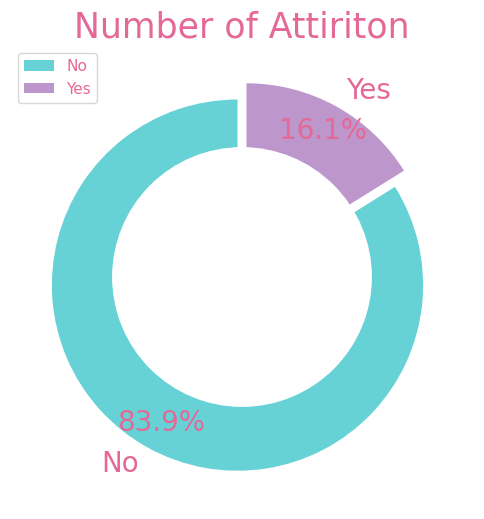

In [25]:
colors = ['#66D2D6', '#BD97CB']
explode = (0.05,0.05)
fig, ax = plt.subplots(figsize = (9,5))
plt.pie(attrition_count['Attrition'], colors = colors, labels=['No','Yes'], autopct='%1.1f%%', startangle=90, pctdistance=0.85, explode = explode,textprops=dict(color="#E56997",fontsize=20))
centre_circle = plt.Circle((0,0),0.70,fc='#ffffff')
fig = plt.gcf()
fig.gca().add_artist(centre_circle)
plt.tight_layout()
plt.title('Number of Attiriton', color='#E56997',size=25)
plt.legend(labelcolor='#E56997')
fig.set_facecolor('#ffffff')
plt.show() 

In [26]:
df= df.drop(['Attrition_num'],axis=1)

In [27]:
num_cols= [col for col in df.columns if df[col].dtypes != "O"]

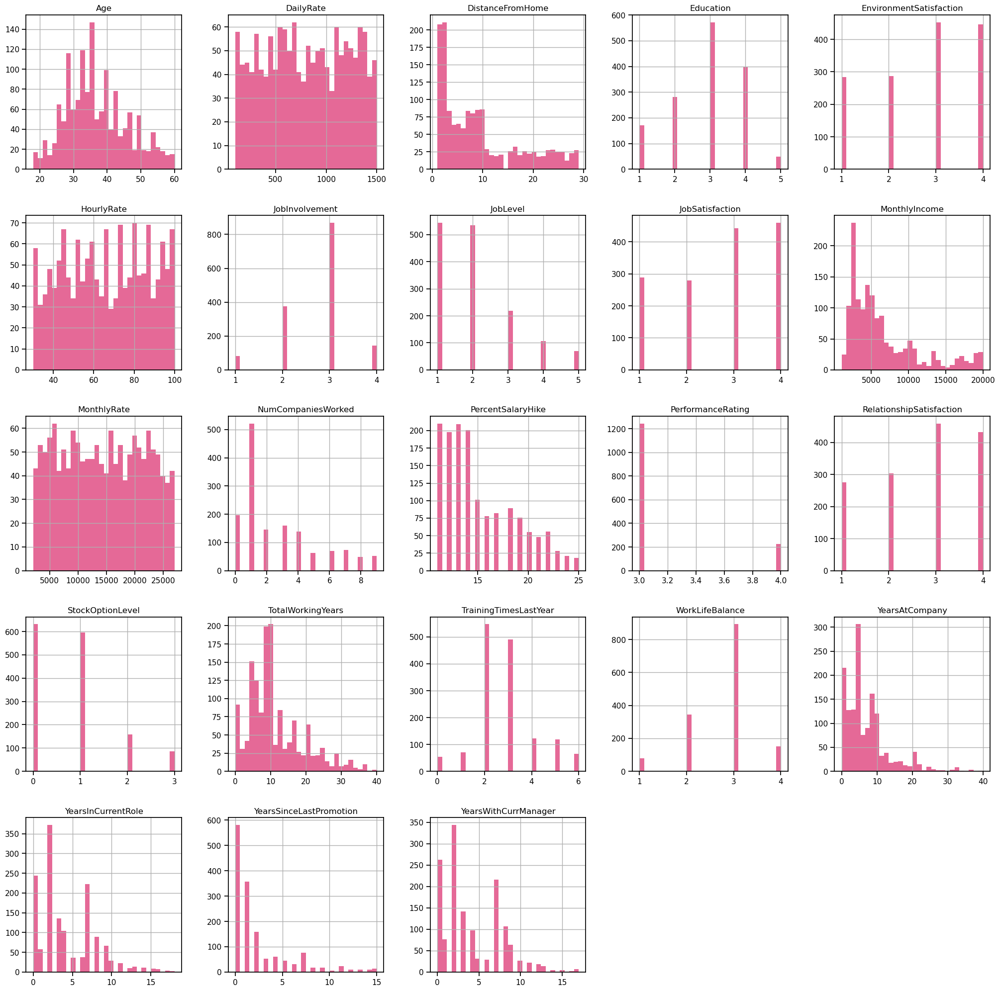

In [28]:
df.hist(figsize=(25, 25), bins = 30, color="#E56997")
plt.show()

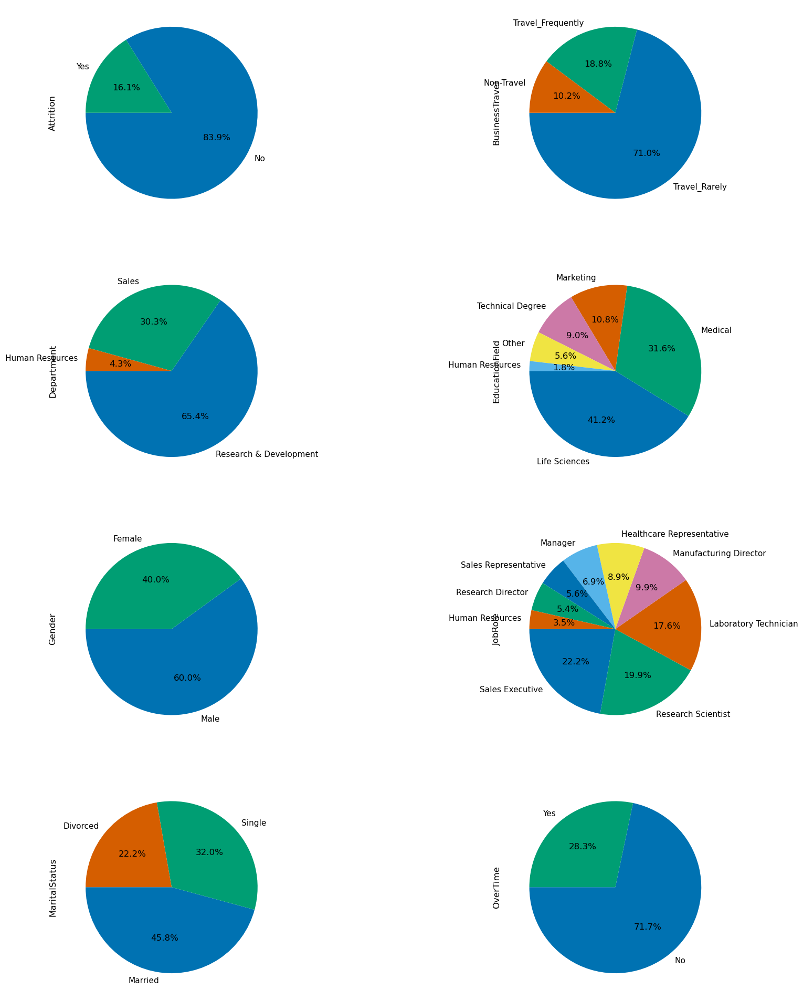

In [29]:
fig=plt.figure(figsize=(20,50))
plt.style.use('seaborn-colorblind')
for i in range(len((df.select_dtypes(include='object')).columns)):
    fig.add_subplot(8,2,i+1)
    df.select_dtypes(include='object').iloc[:,i].value_counts().plot(kind="pie",  subplots=True,autopct='%1.1f%%',
        shadow=False, startangle=180)

Ex-exmployees: median age = 32 years old and standard deviation = 9.7
Current exmployees: median age = 36 years old and standard deviation = 8.9


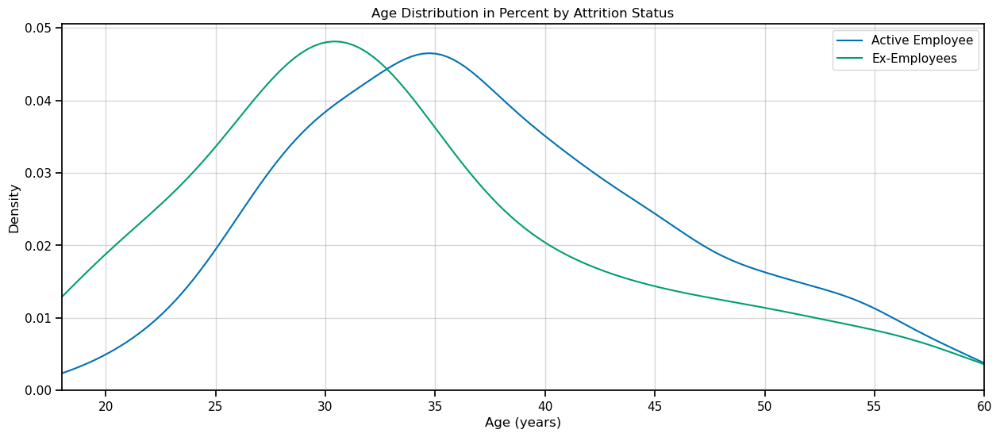

In [30]:
plt.figure(figsize=(15,6))
plt.grid(True, alpha=0.5)
sns.kdeplot(df.loc[df['Attrition'] == 'No', 'Age'], label = 'Active Employee')
sns.kdeplot(df.loc[df['Attrition'] == 'Yes', 'Age'], label = 'Ex-Employees')
plt.xlim(left=18, right=60)
plt.xlabel('Age (years)')
plt.ylabel('Density')
plt.legend()
plt.title('Age Distribution in Percent by Attrition Status');
print('Ex-exmployees: median age = {:.0f} years old and standard deviation = {:.1f}'.format(df[df['Attrition']=='Yes']['Age'].median(), df[df['Attrition']=='Yes']['Age'].std()))
print('Current exmployees: median age = {:.0f} years old and standard deviation = {:.1f}'.format(df[df['Attrition']=='No']['Age'].median(), df[df['Attrition']=='No']['Age'].std()))

Distance from home for employees to get to work is from 1 to 29 miles.
Average distance from home for currently active employees: 8.92 miles and ex-employees: 10.63 miles
Median distance from home for currently active employees: 7 miles and ex-employees: 9 miles
Standard Deviation distance from home for currently active employees: 8.01 miles and ex-employees: 8.45 miles


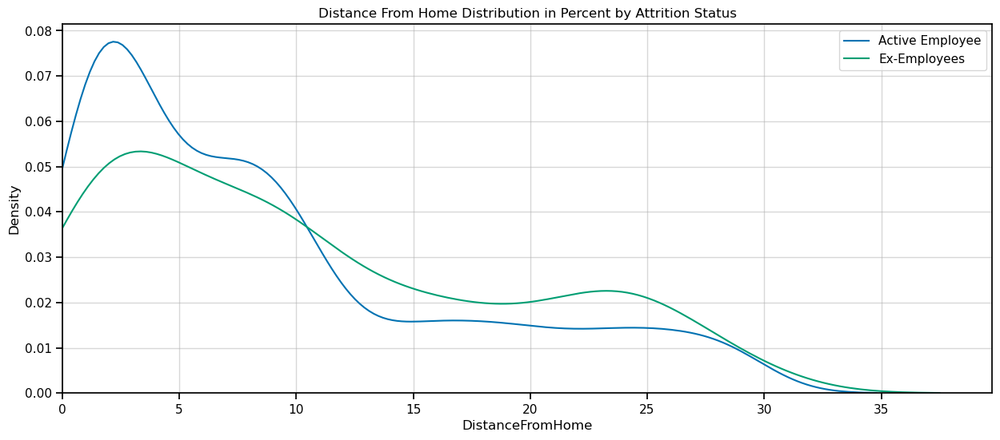

In [31]:
print("Distance from home for employees to get to work is from {} to {} miles.".format(df['DistanceFromHome'].min(),
                                                                                       df['DistanceFromHome'].max()))

print('Average distance from home for currently active employees: {:.2f} miles and ex-employees: {:.2f} miles'.format(
    df[df['Attrition'] == 'No']['DistanceFromHome'].mean(), df[df['Attrition'] == 'Yes']['DistanceFromHome'].mean()))

print('Median distance from home for currently active employees: {:.0f} miles and ex-employees: {:.0f} miles'.format(
    df[df['Attrition'] == 'No']['DistanceFromHome'].median(), df[df['Attrition'] == 'Yes']['DistanceFromHome'].median()))

print('Standard Deviation distance from home for currently active employees: {:.2f} miles and ex-employees: {:.2f} miles'.format(
    df[df['Attrition'] == 'No']['DistanceFromHome'].std(), df[df['Attrition'] == 'Yes']['DistanceFromHome'].std()))


plt.figure(figsize=(15,6))
plt.grid(True, alpha=0.5)
sns.kdeplot(df.loc[df['Attrition'] == 'No', 'DistanceFromHome'], label = 'Active Employee')
sns.kdeplot(df.loc[df['Attrition'] == 'Yes', 'DistanceFromHome'], label = 'Ex-Employees')
plt.xlabel('DistanceFromHome')
plt.xlim(left=0)
plt.ylabel('Density')
plt.legend()
plt.title('Distance From Home Distribution in Percent by Attrition Status');

Number of Years at the company varies from 0 to 40 years.
Ex-exmployees: median number of year at the company = 3 years old and standard deviation = 9.7
Current exmployees: median number of year at the company = 6 years old and standard deviation = 8.9


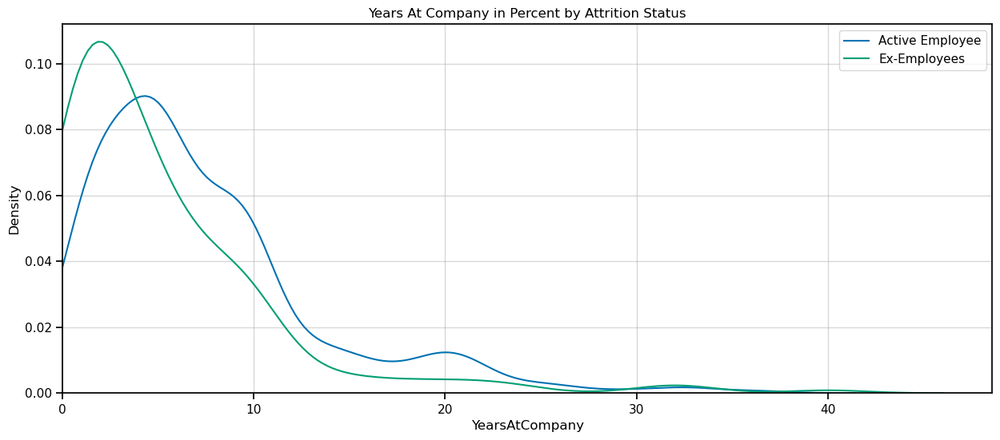

In [32]:
print("Number of Years at the company varies from {} to {} years.".format(
    df['YearsAtCompany'].min(), df['YearsAtCompany'].max()))

print('Ex-exmployees: median number of year at the company = {:.0f} years old and standard deviation = {:.1f}'.format(
    df[df['Attrition']=='Yes']['YearsAtCompany'].median(), df[df['Attrition']=='Yes']['Age'].std()))
print('Current exmployees: median number of year at the company = {:.0f} years old and standard deviation = {:.1f}'.format
      (df[df['Attrition']=='No']['YearsAtCompany'].median(), df[df['Attrition']=='No']['Age'].std()))

plt.figure(figsize=(15,6))
plt.grid(True, alpha=0.5)
sns.kdeplot(df.loc[df['Attrition'] == 'No', 'YearsAtCompany'], label = 'Active Employee')
sns.kdeplot(df.loc[df['Attrition'] == 'Yes', 'YearsAtCompany'], label = 'Ex-Employees')
plt.xlabel('YearsAtCompany')
plt.xlim(left=0)
plt.ylabel('Density')
plt.legend()
plt.title('Years At Company in Percent by Attrition Status');

In [33]:
plot_df = data.groupby(['Department', 'Gender'])['MonthlyIncome'].mean()
plot_df = plot_df.mul(12).rename('Salary').reset_index().sort_values('Salary', ascending=False)
fig = px.bar(plot_df, x='Department', y='Salary', color='Gender', text='Salary',  
             barmode='group', opacity=1, color_discrete_map={'Female': '#BD97CB','Male': '#66D2D6'},)
fig.update_traces(texttemplate='$%{text:,.0f}', textposition='outside',
                  marker_line=dict(width=1, color='#E56997'),  width=.4)
fig.update_yaxes(zeroline=True, zerolinewidth=1, zerolinecolor='#FBC740',gridcolor='#525050')
fig.update_layout(title_text='Average Salaries by Department & Gender', font_color='#E56997',width=1000,
                  height=500,
                  yaxis=dict(title='Salary',tickprefix='$'), paper_bgcolor='#ffffff', plot_bgcolor='#ffffff')
fig.show()

In [34]:
plot_df = data.groupby('JobRole')['MonthlyIncome'].mean()
plot_df = plot_df.mul(12).rename('Salary').reset_index().sort_values('Salary', ascending=False)
fig = px.bar(plot_df, x='JobRole', y='Salary', text='Salary', opacity=1)
fig.update_traces(texttemplate='$%{text:,.0f}', textposition='outside',
                  marker_line=dict(width=0.4, color='#FBC740'), marker_color=['#BD97CB', '#66D2D6', '#FF2768', '#0C6980',"#C4DBE0","#F51720","#F9BDC0","#FBE698","#4C5270"])
fig.update_yaxes(zeroline=True, zerolinewidth=1, zerolinecolor='#FBC740',gridcolor='#525050')
fig.update_layout(title_text='Average Salaries by Job Role', font_color='#E56997',
                  yaxis=dict(title='Salary',tickprefix='$'), width=1000,
                  height=500,
                  xaxis_title='', paper_bgcolor='#ffffff', plot_bgcolor='#ffffff')

fig.show()

In [35]:
categorical_features = ['Attrition', 'BusinessTravel','Department','Education', 'EducationField','EnvironmentSatisfaction', 'Gender', 'JobInvolvement', 'JobLevel', 'JobRole', 'JobSatisfaction',
                    'MaritalStatus','OverTime', 'PerformanceRating', 'RelationshipSatisfaction', 'StockOptionLevel','WorkLifeBalance']


In [36]:
categorical_features.remove("Attrition")

In [37]:
for i in categorical_features:
    print(i)
    
    plot_df = data.groupby(['Attrition'])[i].value_counts(normalize=True)
    plot_df = plot_df.mul(100).rename('Percent').reset_index().sort_values(i)
    #figure = make_subplots(rows = 3,  cols = 3,horizontal_spacing = 0.25)
    figure = px.bar(plot_df, x=i, y='Percent', text='Percent', opacity=1,
             facet_col="Attrition",category_orders={"Attrition": ["Yes", "No"]}, width = 1000,height=500)
    figure.update_traces(texttemplate='%{text:.2s}%', textposition='outside', 
                  marker_color=['#BD97CB', '#66D2D6', '#FF2768', '#0C6980',"#C4DBE0","#F51720","#F9BDC0","#FBE698","#4C5270"],
                  marker_line=dict(width=0.4, color='#FBC740'))
    figure.update_yaxes(title="",zeroline=True, zerolinewidth=1, zerolinecolor='#FBC740', ticksuffix='%',gridcolor='#525050')
    figure.update_layout(title_text='Attrition Rates by ' + str(i), bargap=.09,font_color='#E56997',
                  xaxis_title=str(i),paper_bgcolor='#ffffff', plot_bgcolor='#ffffff')
    #figure.write_html('first_figure.html', auto_open=True)
    figure.show()


BusinessTravel


Department


Education


EducationField


EnvironmentSatisfaction


Gender


JobInvolvement


JobLevel


JobRole


JobSatisfaction


MaritalStatus


OverTime


PerformanceRating


RelationshipSatisfaction


StockOptionLevel


WorkLifeBalance


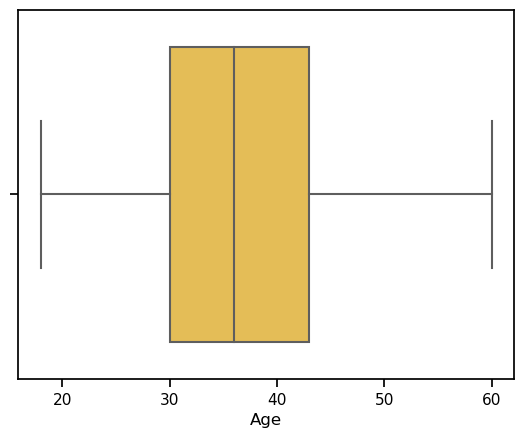

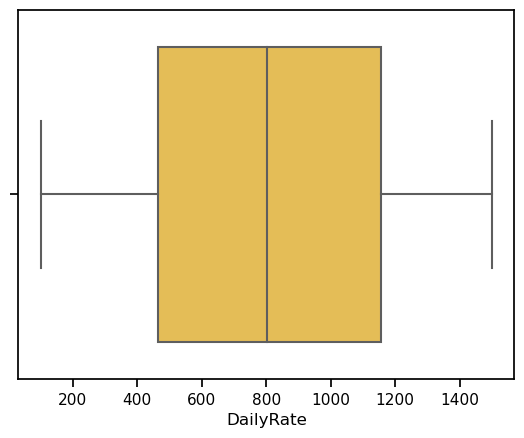

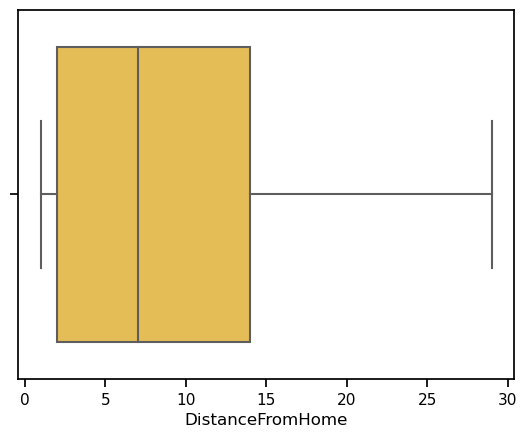

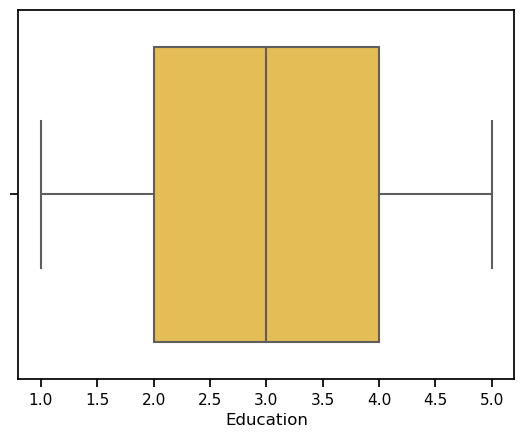

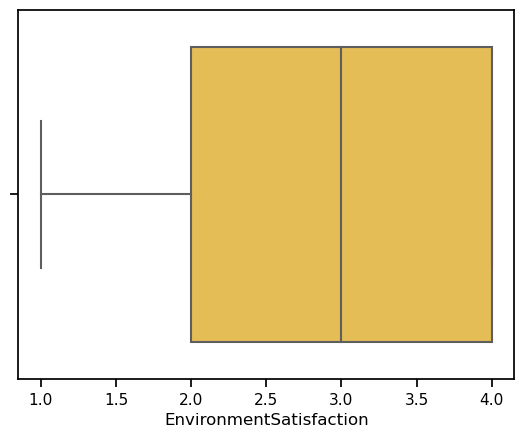

...

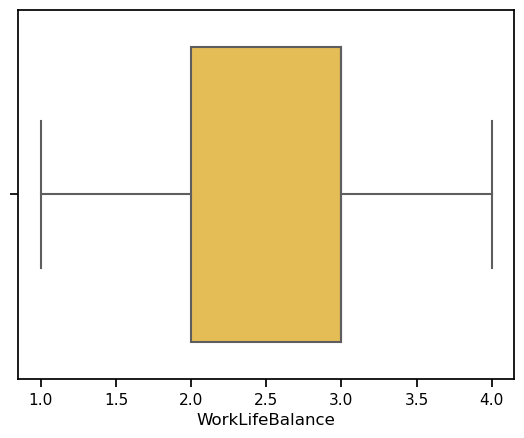

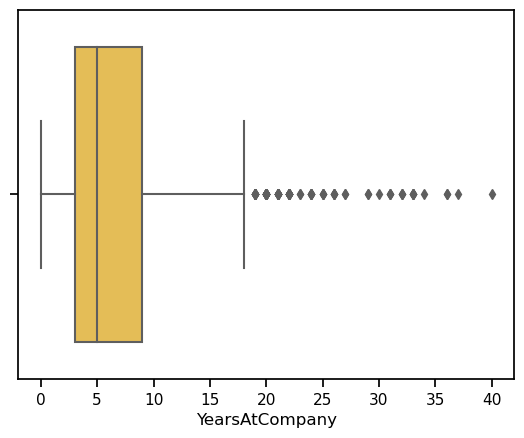

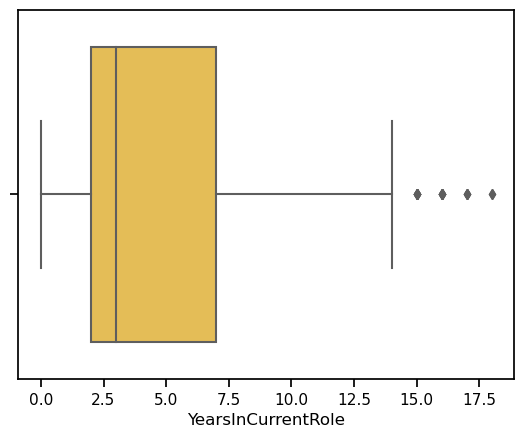

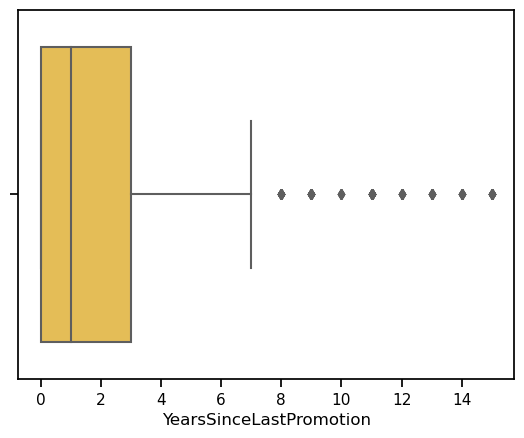

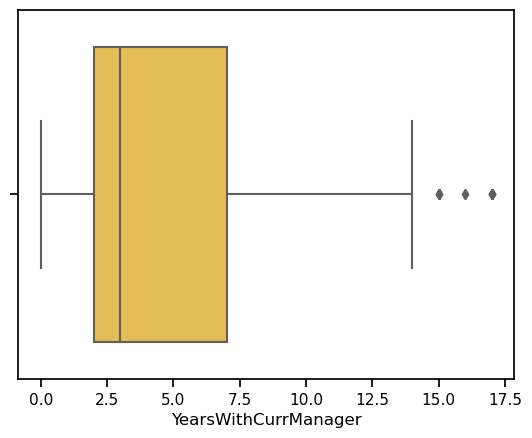

In [38]:
for col in num_cols:
    sns.boxplot(x=df[col], color="#FBC740")
    plt.show()

In [39]:
def Winsorization_outliers(df):
    q1 = np.percentile(df , 1)
    q3 = np.percentile(df , 99)
    out=[]
    for i in df:
        if (i > q3 or i < q1) and i>0:
            out.append(i)
    print("Outliers:",out)
    return out;
def remove_outliers(df):
    print("Registers in the initial dataset:",df.shape[0])
    for col in df.columns[1:]:
        if df[col].dtype != 'object':
            print(col)
            data_filter = Winsorization_outliers(df[col])
            df = df[~df[col].isin(data_filter)]
            print("Registers without outliers in "+col+" :"+ str(df.shape[0]))
    return df;


df_cleaned = remove_outliers(df)

Registers in the initial dataset: 1470
DailyRate
Outliers: [103, 1488, 111, 1496, 111, 106, 1490, 1490, 1499, 1495, 102, 109, 1492, 111, 116, 107, 1498, 1495, 1490, 1496, 115, 104, 1495, 1490, 116, 105]
Registers without outliers in DailyRate :1444
DistanceFromHome
Outliers: []
Registers without outliers in DistanceFromHome :1444
Education
Outliers: []
Registers without outliers in Education :1444
EnvironmentSatisfaction
Outliers: []
Registers without outliers in EnvironmentSatisfaction :1444
HourlyRate
Outliers: []
Registers without outliers in HourlyRate :1444
JobInvolvement
Outliers: []
Registers without outliers in JobInvolvement :1444
JobLevel
Outliers: []
Registers without outliers in JobLevel :1444
JobSatisfaction
Outliers: []
Registers without outliers in JobSatisfaction :1444
MonthlyIncome
Outliers: [1232, 19926, 1102, 19999, 1200, 1009, 1281, 19859, 1051, 19973, 19845, 1052, 19627, 19943, 19740, 1223, 1118, 19847, 19717, 19701, 1359, 1261, 1274, 19658, 19833, 19665, 1081, 109

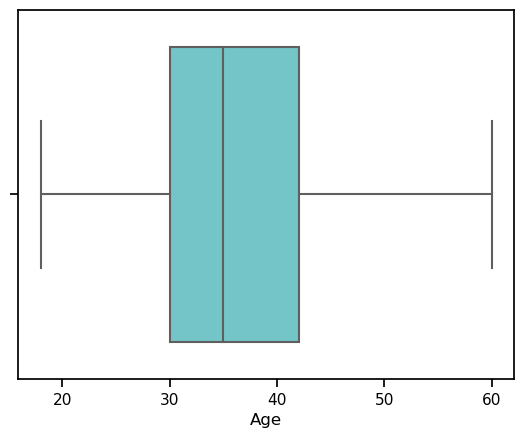

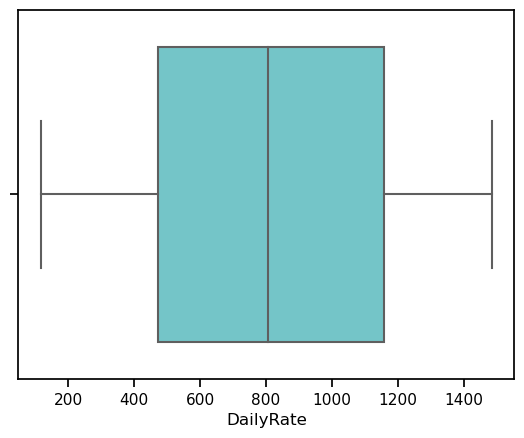

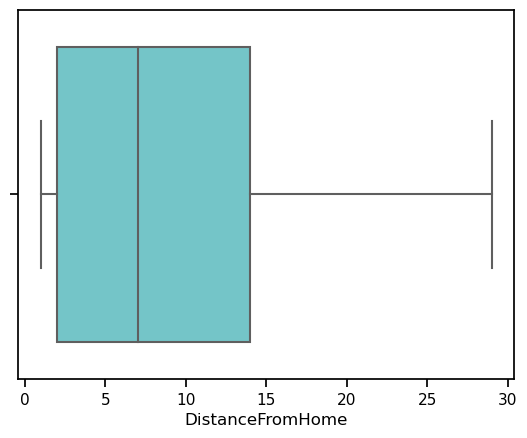

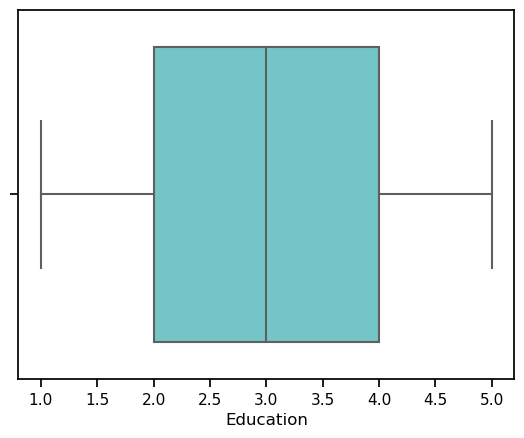

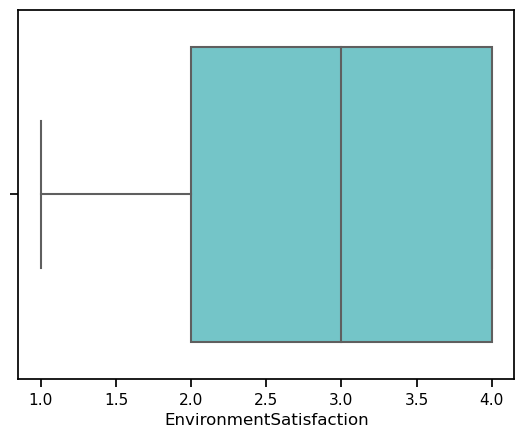

...

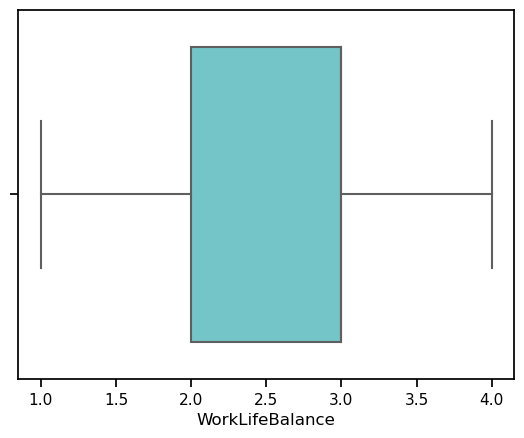

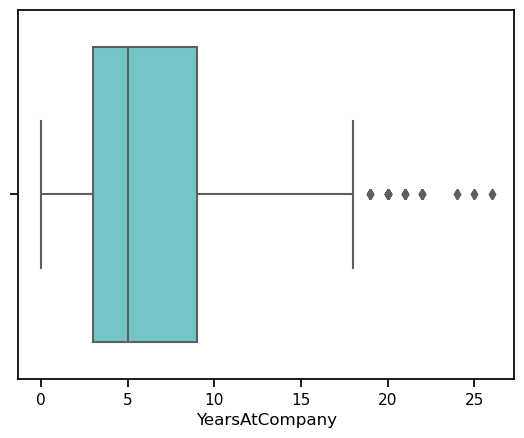

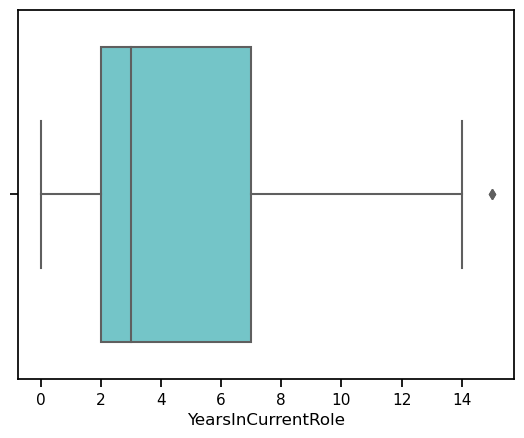

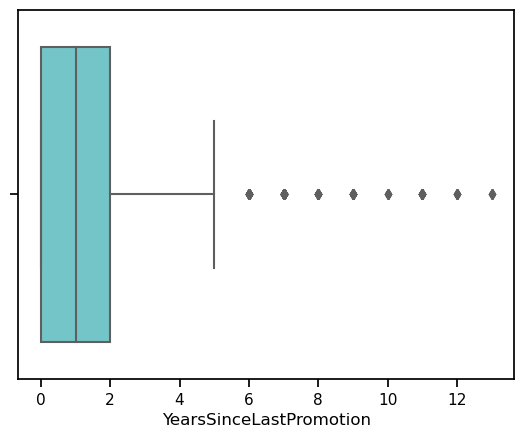

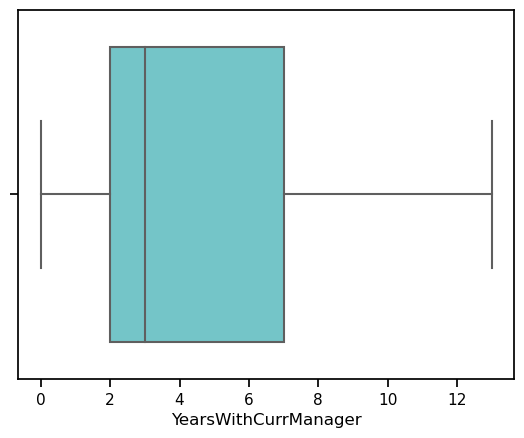

In [40]:
for col in num_cols:
    sns.boxplot(x=df_cleaned[col], color="#66D2D6")
    plt.show()

In [41]:
df_cleaned=df

In [42]:
dff = df.drop(['Attrition'],axis=1)

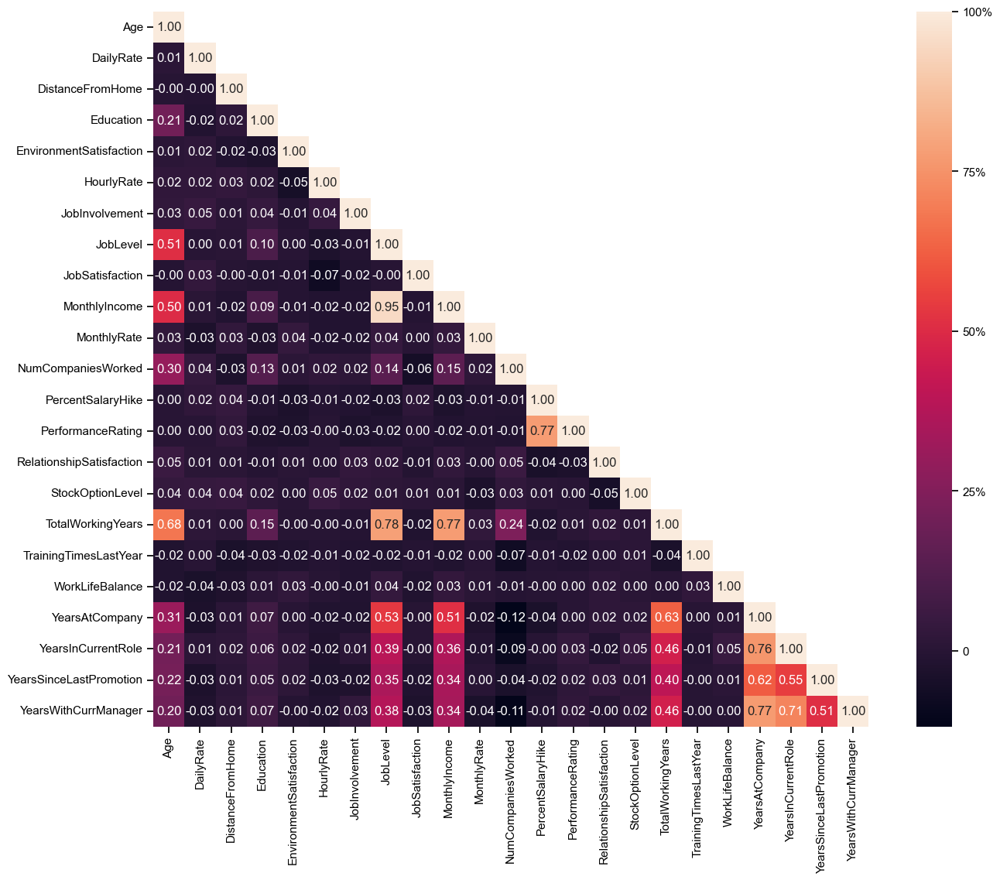

In [43]:
colors=["#eed7a1",'#B6735F', '#D7C2B0', '#497B7A', '#9EB5A3',"#d97f85","#877e77","#8a879a","#dec8ba"]
plt.figure(figsize=(16, 12))
mask = np.triu(np.ones_like(dff.corr(), dtype=np.bool))
mask[np.tril_indices_from(mask)] = False
fig=plt.gcf()
heatmap = sns.heatmap(dff.corr(), mask=mask, fmt='.2f', annot=True,cbar=True,square = True)
sns.set_palette(sns.color_palette(colors))
sns.set(rc={'axes.facecolor':'#EFF1DB', 'figure.facecolor':'#EFF1DB'})
heatmap.tick_params(colors='black', which='both')
cbar = heatmap.collections[0].colorbar
cbar.ax.tick_params(colors='black')
cbar.set_ticks([0, .25, .5,.75, 1])
cbar.set_ticklabels(['0', '25%','50%' ,'75%', '100%'])

In [44]:
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import MinMaxScaler, OneHotEncoder
from sklearn.preprocessing import OneHotEncoder

In [45]:
df.head()

,Age,Attrition,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EnvironmentSatisfaction,Gender,HourlyRate,JobInvolvement,JobLevel,JobRole,JobSatisfaction,MaritalStatus,MonthlyIncome,MonthlyRate,NumCompaniesWorked,OverTime,PercentSalaryHike,PerformanceRating,RelationshipSatisfaction,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
0,41,Yes,Travel_Rarely,1102,Sales,1,2,Life Sciences,2,Female,94,3,2,Sales Executive,4,Single,5993,19479,8,Yes,11,3,1,0,8,0,1,6,4,0,5
1,49,No,Travel_Frequently,279,Research & Development,8,1,Life Sciences,3,Male,61,2,2,Research Scientist,2,Married,5130,24907,1,No,23,4,4,1,10,3,3,10,7,1,7
2,37,Yes,Travel_Rarely,1373,Research & Development,2,2,Other,4,Male,92,2,1,Laboratory Technician,3,Single,2090,2396,6,Yes,15,3,2,0,7,3,3,0,0,0,0
3,33,No,Travel_Frequently,1392,Research & Development,3,4,Life Sciences,4,Female,56,3,1,Research Scientist,3,Married,2909,23159,1,Yes,11,3,3,0,8,3,3,8,7,3,0
4,27,No,Travel_Rarely,591,Research & Development,2,1,Medical,1,Male,40,3,1,Laboratory Technician,2,Married,3468,16632,9,No,12,3,4,1,6,3,3,2,2,2,2


In [46]:
df['Attrition'] = df['Attrition'].map({'Yes': 1, 'No': 0})
df['OverTime'] = df['OverTime'].map({'Yes': 1, 'No': 0})
df['Gender'] = df['Gender'].map({'Male': 1, 'Female': 0})
df['PerformanceRating'] = df['PerformanceRating'].map({3: 0, 4: 1})
nominals = ['BusinessTravel','Department','EducationField','JobRole','MaritalStatus']
df_ohe = pd.get_dummies(df, columns = nominals)
df_ohe.head()

,Age,Attrition,DailyRate,DistanceFromHome,Education,EnvironmentSatisfaction,Gender,HourlyRate,JobInvolvement,JobLevel,JobSatisfaction,MonthlyIncome,MonthlyRate,NumCompaniesWorked,OverTime,PercentSalaryHike,PerformanceRating,RelationshipSatisfaction,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager,BusinessTravel_Non-Travel,BusinessTravel_Travel_Frequently,BusinessTravel_Travel_Rarely,Department_Human Resources,Department_Research & Development,Department_Sales,EducationField_Human Resources,EducationField_Life Sciences,EducationField_Marketing,EducationField_Medical,EducationField_Other,EducationField_Technical Degree,JobRole_Healthcare Representative,JobRole_Human Resources,JobRole_Laboratory Technician,JobRole_Manager,JobRole_Manufacturing Director,JobRole_Research Director,JobRole_Research Scientist,JobRole_Sales Executive,JobRole_Sales Representative,MaritalStatus_Divorced,MaritalStatus_Married,MaritalStatus_Single
0,41,1,1102,1,2,2,0,94,3,2,4,5993,19479,8,1,11,0,1,0,8,0,1,6,4,0,5,0,0,1,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1
1,49,0,279,8,1,3,1,61,2,2,2,5130,24907,1,0,23,1,4,1,10,3,3,10,7,1,7,0,1,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0
2,37,1,1373,2,2,4,1,92,2,1,3,2090,2396,6,1,15,0,2,0,7,3,3,0,0,0,0,0,0,1,0,1,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,1
3,33,0,1392,3,4,4,0,56,3,1,3,2909,23159,1,1,11,0,3,0,8,3,3,8,7,3,0,0,1,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0
4,27,0,591,2,1,1,1,40,3,1,2,3468,16632,9,0,12,0,4,1,6,3,3,2,2,2,2,0,0,1,0,1,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,1,0


In [47]:
df_ohe.shape

(1470, 50)

In [48]:
from sklearn.preprocessing import MinMaxScaler

In [49]:
scaler = MinMaxScaler()
model=scaler.fit(df_ohe)
scaled=model.transform(df_ohe)
df_scaled = pd.DataFrame(scaled, index=df_ohe.index, columns=df_ohe.columns)
df_scaled.head()

,Age,Attrition,DailyRate,DistanceFromHome,Education,EnvironmentSatisfaction,Gender,HourlyRate,JobInvolvement,JobLevel,JobSatisfaction,MonthlyIncome,MonthlyRate,NumCompaniesWorked,OverTime,PercentSalaryHike,PerformanceRating,RelationshipSatisfaction,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager,BusinessTravel_Non-Travel,BusinessTravel_Travel_Frequently,BusinessTravel_Travel_Rarely,Department_Human Resources,Department_Research & Development,Department_Sales,EducationField_Human Resources,EducationField_Life Sciences,EducationField_Marketing,EducationField_Medical,EducationField_Other,EducationField_Technical Degree,JobRole_Healthcare Representative,JobRole_Human Resources,JobRole_Laboratory Technician,JobRole_Manager,JobRole_Manufacturing Director,JobRole_Research Director,JobRole_Research Scientist,JobRole_Sales Executive,JobRole_Sales Representative,MaritalStatus_Divorced,MaritalStatus_Married,MaritalStatus_Single
0,0.547619,1.0,0.715820,0.000000,0.25,0.333333,0.0,0.914286,0.666667,0.25,1.000000,0.262454,0.698053,0.888889,1.0,0.000000,0.0,0.000000,0.000000,0.200,0.0,0.000000,0.15,0.222222,0.000000,0.294118,0.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0
1,0.738095,0.0,0.126700,0.250000,0.00,0.666667,1.0,0.442857,0.333333,0.25,0.333333,0.217009,0.916001,0.111111,0.0,0.857143,1.0,1.000000,0.333333,0.250,0.5,0.666667,0.25,0.388889,0.066667,0.411765,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0
2,0.452381,1.0,0.909807,0.035714,0.25,1.000000,1.0,0.885714,0.333333,0.00,0.666667,0.056925,0.012126,0.666667,1.0,0.285714,0.0,0.333333,0.000000,0.175,0.5,0.666667,0.00,0.000000,0.000000,0.000000,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
3,0.357143,0.0,0.923407,0.071429,0.75,1.000000,0.0,0.371429,0.666667,0.00,0.666667,0.100053,0.845814,0.111111,1.0,0.000000,0.0,0.666667,0.000000,0.200,0.5,0.666667,0.20,0.388889,0.200000,0.000000,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0
4,0.214286,0.0,0.350036,0.035714,0.00,0.000000,1.0,0.142857,0.666667,0.00,0.333333,0.129489,0.583738,1.000000,0.0,0.071429,0.0,1.000000,0.333333,0.150,0.5,0.666667,0.05,0.111111,0.133333,0.117647,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0


In [50]:
from sklearn.model_selection import train_test_split, cross_val_score

In [51]:
X = df_scaled.drop(['Attrition'],axis=1)
y = df_scaled['Attrition']
X_train, X_test, y_train, y_test = train_test_split(X,y,test_size=0.3,random_state=1)
X_train.shape, X_test.shape, y_train.shape, y_test.shape

((1029, 49), (441, 49), (1029,), (441,))

In [52]:
def print_score(clf, X_train, y_train, X_test, y_test, train=True):
    if train:
        pred = clf.predict(X_train)
        clf_report = pd.DataFrame(classification_report(y_train, pred, output_dict=True))
        print("Train Result:\n================================================")
        print(f"Accuracy Score: {accuracy_score(y_train, pred) * 100:.2f}%")
        print("_______________________________________________")
        print(f"CLASSIFICATION REPORT:\n{clf_report}")
        print("_______________________________________________")
        print(f"Confusion Matrix: \n {confusion_matrix(y_train, pred)}\n")
        
    elif train==False:
        pred = clf.predict(X_test)
        clf_report = pd.DataFrame(classification_report(y_test, pred, output_dict=True))
        print("Test Result:\n================================================")        
        print(f"Accuracy Score: {accuracy_score(y_test, pred) * 100:.2f}%")
        print("_______________________________________________")
        print(f"CLASSIFICATION REPORT:\n{clf_report}")
        print("_______________________________________________")
        print(f"Confusion Matrix: \n {confusion_matrix(y_test, pred)}\n")

In [53]:
grid = {'n_estimators': [int(x) for x in np.linspace(start = 100, stop = 500, num = 5)],
        'max_features': [None, 'sqrt'],
        'max_depth': [None, 5, 7, 14, 21],
        'min_samples_split': [2, 5, 8],
        'min_samples_leaf': [3, 4, 5],
        'bootstrap': [True, False]}

rf=RandomForestClassifier(random_state=92)
rf_clf=RandomizedSearchCV(estimator=rf, param_distributions=grid, scoring='roc_auc', 
                         n_iter=100, cv=5, random_state=92, n_jobs=-1)
rf_clf.fit(X_train, y_train)
print("Grid Search CV Best AUC = {:.3f}\nBest Params: {}".format(rf_clf.best_score_, rf_clf.best_estimator_))

Grid Search CV Best AUC = 0.801
Best Params: RandomForestClassifier(max_features='sqrt', min_samples_leaf=5,
                       min_samples_split=5, n_estimators=300, random_state=92)


In [54]:
print_score(rf_clf, X_train, y_train, X_test, y_test, train=True)
print_score(rf_clf, X_train, y_train, X_test, y_test, train=False)

Train Result:
Accuracy Score: 89.41%
_______________________________________________
CLASSIFICATION REPORT:
                  0.0         1.0  accuracy    macro avg  weighted avg
precision    0.888548    1.000000  0.894072     0.944274      0.905878
recall       1.000000    0.318750  0.894072     0.659375      0.894072
f1-score     0.940985    0.483412  0.894072     0.712199      0.869837
support    869.000000  160.000000  0.894072  1029.000000   1029.000000
_______________________________________________
Confusion Matrix: 
 [[869   0]
 [109  51]]

Test Result:
Accuracy Score: 83.67%
_______________________________________________
CLASSIFICATION REPORT:
                  0.0        1.0  accuracy   macro avg  weighted avg
precision    0.839535   0.727273  0.836735    0.783404      0.819934
recall       0.991758   0.103896  0.836735    0.547827      0.836735
f1-score     0.909320   0.181818  0.836735    0.545569      0.782296
support    364.000000  77.000000  0.836735  441.000000    441.

In [55]:
dt_clf = DecisionTreeClassifier(criterion="gini", max_depth=7,min_samples_split=2,  min_samples_leaf=1,random_state=42) 
dt_clf.fit(X_train, y_train)
print_score(dt_clf, X_train, y_train, X_test, y_test, train=True)
print_score(dt_clf, X_train, y_train, X_test, y_test, train=False)

Train Result:
Accuracy Score: 94.46%
_______________________________________________
CLASSIFICATION REPORT:
                  0.0         1.0  accuracy    macro avg  weighted avg
precision    0.944201    0.947826  0.944606     0.946014      0.944765
recall       0.993096    0.681250  0.944606     0.837173      0.944606
f1-score     0.968031    0.792727  0.944606     0.880379      0.940773
support    869.000000  160.000000  0.944606  1029.000000   1029.000000
_______________________________________________
Confusion Matrix: 
 [[863   6]
 [ 51 109]]

Test Result:
Accuracy Score: 81.18%
_______________________________________________
CLASSIFICATION REPORT:
                  0.0        1.0  accuracy   macro avg  weighted avg
precision    0.864935   0.446429  0.811791    0.655682      0.791863
recall       0.914835   0.324675  0.811791    0.619755      0.811791
f1-score     0.889186   0.375940  0.811791    0.632563      0.799571
support    364.000000  77.000000  0.811791  441.000000    441.

In [56]:
xgb_clf = xgb.XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
                           colsample_bytree=0.8, gamma=1.5, learning_rate=0.05,
                           max_delta_step=0, max_depth=5, min_child_weight=7,
                           n_estimators=200, n_jobs=-1, nthread=None,
                           objective='binary:logistic', random_state=0, reg_alpha=0,
                           reg_lambda=1, scale_pos_weight=1, seed=None,
                           subsample=0.6)
xgb_clf.fit(X_train, y_train)
print_score(xgb_clf, X_train, y_train, X_test, y_test, train=True)
print_score(xgb_clf, X_train, y_train, X_test, y_test, train=False)

Train Result:
Accuracy Score: 93.49%
_______________________________________________
CLASSIFICATION REPORT:
                  0.0         1.0  accuracy    macro avg  weighted avg
precision    0.929336    0.989474  0.934888     0.959405      0.938687
recall       0.998849    0.587500  0.934888     0.793175      0.934888
f1-score     0.962840    0.737255  0.934888     0.850047      0.927763
support    869.000000  160.000000  0.934888  1029.000000   1029.000000
_______________________________________________
Confusion Matrix: 
 [[868   1]
 [ 66  94]]

Test Result:
Accuracy Score: 86.85%
_______________________________________________
CLASSIFICATION REPORT:
                  0.0        1.0  accuracy   macro avg  weighted avg
precision    0.869565   0.851852  0.868481    0.860709      0.866472
recall       0.989011   0.298701  0.868481    0.643856      0.868481
f1-score     0.925450   0.442308  0.868481    0.683879      0.841092
support    364.000000  77.000000  0.868481  441.000000    441.

In [57]:
cb_clf = CatBoostClassifier()
cb_clf.fit(X_train, y_train, verbose=0)
print_score(cb_clf, X_train, y_train, X_test, y_test, train=True)
print_score(cb_clf, X_train, y_train, X_test, y_test, train=False)

Train Result:
Accuracy Score: 98.54%
_______________________________________________
CLASSIFICATION REPORT:
                  0.0        1.0  accuracy    macro avg  weighted avg
precision    0.983032    1.00000  0.985423     0.991516      0.985670
recall       1.000000    0.90625  0.985423     0.953125      0.985423
f1-score     0.991443    0.95082  0.985423     0.971131      0.985127
support    869.000000  160.00000  0.985423  1029.000000   1029.000000
_______________________________________________
Confusion Matrix: 
 [[869   0]
 [ 15 145]]

Test Result:
Accuracy Score: 84.35%
_______________________________________________
CLASSIFICATION REPORT:
                  0.0        1.0  accuracy   macro avg  weighted avg
precision    0.848700   0.722222  0.843537    0.785461      0.826616
recall       0.986264   0.168831  0.843537    0.577547      0.843537
f1-score     0.912325   0.273684  0.843537    0.593005      0.800817
support    364.000000  77.000000  0.843537  441.000000    441.00000